In [1]:
%load_ext autoreload
%autoreload 2
import copy
import os
import pandas as pd
import matplotlib.pyplot as plt
import tsam.timeseriesaggregation as tsam
import numpy as np
%matplotlib inline

In [2]:
raw = pd.read_csv('timeSeries_TSA.csv', index_col = 0).loc[:,'Photovoltaic\r\n[kW/kWp]'].to_frame()

In [3]:
def plotTS(data, periodlength, vmin, vmax, figName):
    fig, axes = plt.subplots(figsize = [6, 2], dpi = 100, nrows = 1, ncols = 1)
    stacked, timeindex = tsam.unstackToPeriods(copy.deepcopy(data), periodlength)
    cax = axes.imshow(stacked.values.T, interpolation = 'nearest', vmin = vmin, vmax = vmax)
    axes.set_aspect('auto')  
    axes.set_ylabel('Hour')
    plt.xlabel('Day')

    fig.subplots_adjust(right = 1.2)
    cbar=plt.colorbar(cax)    
    cbar.set_label(r'$\mathrm{\frac{kW}{kW_p}}$')
    fig.savefig('Illustrations/'+figName+'.png',bbox_inches='tight',dpi=300)

In [4]:
aggregation = tsam.TimeSeriesAggregation(raw, noTypicalPeriods = 12, hoursPerPeriod = 24, 
                                        clusterMethod = 'k_means')

In [5]:
typPeriods = aggregation.createTypicalPeriods()

In [6]:
predictedPeriods = aggregation.predictOriginalData()

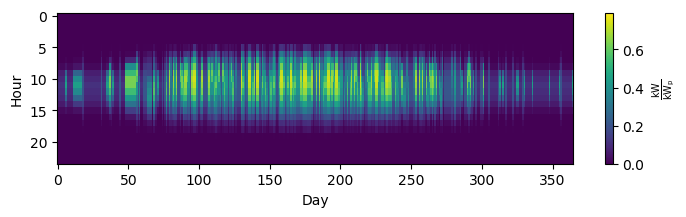

In [7]:
plotTS(predictedPeriods['Photovoltaic\r\n[kW/kWp]'], 24, vmin = raw['Photovoltaic\r\n[kW/kWp]'].min(), vmax = raw['Photovoltaic\r\n[kW/kWp]'].max(), figName='Clustering')

In [8]:
downsampleFactor=6

In [9]:
rawAvg=raw.groupby(np.arange(len(raw))//downsampleFactor).mean()

In [10]:
rawAvg=rawAvg.loc[rawAvg.index.repeat(downsampleFactor)].reset_index(drop=True)

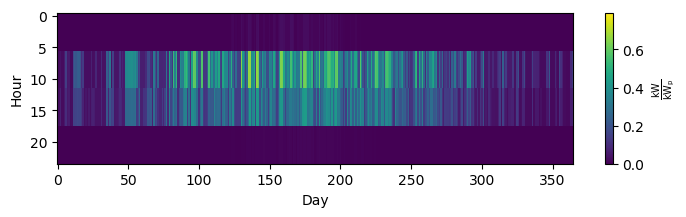

In [11]:
plotTS(rawAvg['Photovoltaic\r\n[kW/kWp]'], 24, vmin = raw['Photovoltaic\r\n[kW/kWp]'].min(), vmax = raw['Photovoltaic\r\n[kW/kWp]'].max(), figName='Downsample')

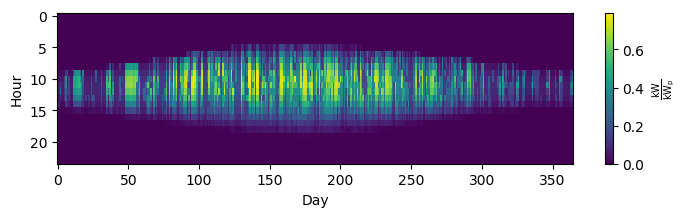

In [12]:
plotTS(raw['Photovoltaic\r\n[kW/kWp]'], 24, vmin = raw['Photovoltaic\r\n[kW/kWp]'].min(), vmax = raw['Photovoltaic\r\n[kW/kWp]'].max(), figName='Reference')

In [13]:
aggregation = tsam.TimeSeriesAggregation(raw, noTypicalPeriods = 12, hoursPerPeriod = 24, 
                                        clusterMethod = 'averaging')

In [14]:
typPeriods = aggregation.createTypicalPeriods()

In [15]:
predictedPeriods = aggregation.predictOriginalData()

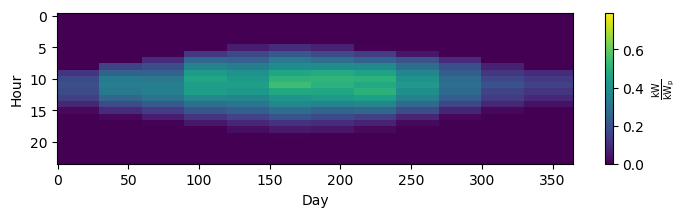

In [16]:
plotTS(predictedPeriods['Photovoltaic\r\n[kW/kWp]'], 24, vmin = raw['Photovoltaic\r\n[kW/kWp]'].min(), vmax = raw['Photovoltaic\r\n[kW/kWp]'].max(), figName='Averaging')

In [17]:
raw['Photovoltaic\r\n[kW/kWp]'].values

array([0., 0., 0., ..., 0., 0., 0.])

In [18]:
from tslearn.generators import random_walks

In [19]:
n_ts, sz, d = 1, 50, 1
dataset = random_walks(n_ts=n_ts, sz=sz, d=d)[0].ravel()

In [20]:
test=pd.DataFrame({'vals':raw['Photovoltaic\r\n[kW/kWp]'].values, 'weight':1})

In [21]:
for i in range(int(8760-8760/downsampleFactor)):
    mergeIdx=abs(test.diff()).loc[:,'vals'].idxmin()
    test.iloc[mergeIdx,:]+test.iloc[mergeIdx-1,:]
    centroid=(test.iloc[mergeIdx,0]*test.iloc[mergeIdx,1]+test.iloc[mergeIdx-1,0]*test.iloc[mergeIdx-1,1])/(test.iloc[mergeIdx,1]+test.iloc[mergeIdx-1,1])
    newWeight=test.iloc[mergeIdx,1]+test.iloc[mergeIdx-1,1]
    test.iloc[mergeIdx-1,0]=centroid
    test.iloc[mergeIdx-1,1]=newWeight
    test=test.drop(mergeIdx).reset_index(drop=True)
    print(test)

          vals  weight
0     0.000000       2
1     0.000000       1
2     0.000000       1
3     0.000000       1
4     0.000000       1
5     0.000000       1
6     0.000000       1
7     0.000000       1
8     0.025710       1
9     0.049788       1
10    0.060716       1
11    0.059653       1
12    0.048695       1
13    0.027381       1
14    0.002088       1
15    0.000000       1
16    0.000000       1
17    0.000000       1
18    0.000000       1
19    0.000000       1
20    0.000000       1
21    0.000000       1
22    0.000000       1
23    0.000000       1
24    0.000000       1
25    0.000000       1
26    0.000000       1
27    0.000000       1
28    0.000000       1
29    0.000000       1
...        ...     ...
8729  0.000000       1
8730  0.000000       1
8731  0.000000       1
8732  0.000000       1
8733  0.000000       1
8734  0.000000       1
8735  0.000000       1
8736  0.000000       1
8737  0.000000       1
8738  0.000000       1
8739  0.000000       1
8740  0.000

[8730 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000       8
17    0.000000       1
18    0.000000       1
19    0.000000       1
20    0.000000       1
21    0.000000       1
22    0.000000       1
23    0.000000       1
24    0.000000       1
25    0.000000       1
26    0.026099       1
27    0.047965       1
28    0.159629       1
29    0.272113       1
...        ...     ...
8699  0.000000       1
8700  0.000000       1
8701  0.000000       1
8702  0.000000       1
8703  0.000000       1
8704  0.000000       1
8705  0.000000       1
8706  0.000000       1
8707  0.000000       1
8708  0.000000       1
8709  0.00

[8702 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
8671  0.000000       1
8672  0.000000       1
8673  0.000000       1
8674  0.000000       1
8675  0.000000       1
8676  0.000000       1
8677  0.000000       1
8678  0.000000       1
8679  0.000000       1
8680  0.000000       1
8681  0.00

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
8644  0.000000       1
8645  0.000000       1
8646  0.000000       1
8647  0.000000       1
8648  0.000000       1
8649  0.000000       1
8650  0.000000       1
8651  0.000000       1
8652  0.000000       1
8653  0.000000       1
8654  0.000000       1
8655  0.000

[8649 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
8618  0.000000       1
8619  0.000000       1
8620  0.000000       1
8621  0.000000       1
8622  0.000000       1
8623  0.000000       1
8624  0.000000       1
8625  0.000000       1
8626  0.000000       1
8627  0.000000       1
8628  0.00

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
8592  0.000000       1
8593  0.000000       1
8594  0.000000       1
8595  0.000000       1
8596  0.000000       1
8597  0.000000       1
8598  0.000000       1
8599  0.000000       1
8600  0.000000       1
8601  0.000000       1
8602  0.000000       1
8603  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
8562  0.000000       1
8563  0.000000       1
8564  0.000000       1
8565  0.000000       1
8566  0.000000       1
8567  0.000000       1
8568  0.000000       1
8569  0.000000       1
8570  0.000000       1
8571  0.000000       1
8572  0.000000       1
8573  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
8533  0.000000       1
8534  0.000000       1
8535  0.000000       1
8536  0.000000       1
8537  0.000000       1
8538  0.000000       1
8539  0.000000       1
8540  0.000000       1
8541  0.000000       1
8542  0.000000       1
8543  0.000000       1
8544  0.000

[8535 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
8504  0.000000       1
8505  0.000000       1
8506  0.000000       1
8507  0.000000       1
8508  0.000000       1
8509  0.000000       1
8510  0.000000       1
8511  0.000000       1
8512  0.000000       1
8513  0.000000       1
8514  0.00

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
8477  0.000000       1
8478  0.000000       1
8479  0.000000       1
8480  0.000000       1
8481  0.000000       1
8482  0.000000       1
8483  0.000000       1
8484  0.000000       1
8485  0.000000       1
8486  0.000000       1
8487  0.000000       1
8488  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
8448  0.000000       1
8449  0.000000       1
8450  0.000000       1
8451  0.000000       1
8452  0.000000       1
8453  0.000000       1
8454  0.000000       1
8455  0.000000       1
8456  0.000000       1
8457  0.000000       1
8458  0.000000       1
8459  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
8420  0.000000       1
8421  0.000000       1
8422  0.000000       1
8423  0.000000       1
8424  0.000000       1
8425  0.000000       1
8426  0.000000       1
8427  0.000000       1
8428  0.000000       1
8429  0.000000       1
8430  0.000000       1
8431  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
8391  0.000000       1
8392  0.000000       1
8393  0.000000       1
8394  0.000000       1
8395  0.000000       1
8396  0.000000       1
8397  0.000000       1
8398  0.000000       1
8399  0.000000       1
8400  0.000000       1
8401  0.000000       1
8402  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
8361  0.000000       1
8362  0.000000       1
8363  0.000000       1
8364  0.000000       1
8365  0.000000       1
8366  0.000000       1
8367  0.000000       1
8368  0.000000       1
8369  0.000000       1
8370  0.000000       1
8371  0.000000       1
8372  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
8334  0.000000       1
8335  0.000000       1
8336  0.000000       1
8337  0.000000       1
8338  0.000000       1
8339  0.000000       1
8340  0.000000       1
8341  0.000000       1
8342  0.000000       1
8343  0.000000       1
8344  0.000000       1
8345  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
8305  0.000000       1
8306  0.000000       1
8307  0.000000       1
8308  0.000000       1
8309  0.000000       1
8310  0.000000       1
8311  0.000000       1
8312  0.000000       1
8313  0.000000       1
8314  0.000000       1
8315  0.000000       1
8316  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
8277  0.000000       1
8278  0.000000       1
8279  0.000000       1
8280  0.000000       1
8281  0.000000       1
8282  0.000000       1
8283  0.000000       1
8284  0.000000       1
8285  0.000000       1
8286  0.000000       1
8287  0.000000       1
8288  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
8248  0.000000       1
8249  0.000000       1
8250  0.000000       1
8251  0.000000       1
8252  0.000000       1
8253  0.000000       1
8254  0.000000       1
8255  0.000000       1
8256  0.000000       1
8257  0.000000       1
8258  0.000000       1
8259  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
8220  0.000000       1
8221  0.000000       1
8222  0.000000       1
8223  0.000000       1
8224  0.000000       1
8225  0.000000       1
8226  0.000000       1
8227  0.000000       1
8228  0.000000       1
8229  0.000000       1
8230  0.000000       1
8231  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
8191  0.000000       1
8192  0.000000       1
8193  0.000000       1
8194  0.000000       1
8195  0.000000       1
8196  0.000000       1
8197  0.000000       1
8198  0.000000       1
8199  0.000000       1
8200  0.000000       1
8201  0.000000       1
8202  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
8163  0.000000       1
8164  0.000000       1
8165  0.000000       1
8166  0.000000       1
8167  0.000000       1
8168  0.000000       1
8169  0.000000       1
8170  0.000000       1
8171  0.000000       1
8172  0.000000       1
8173  0.000000       1
8174  0.000

[8165 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
8134  0.000000       1
8135  0.000000       1
8136  0.000000       1
8137  0.000000       1
8138  0.000000       1
8139  0.000000       1
8140  0.000000       1
8141  0.000000       1
8142  0.000000       1
8143  0.000000       1
8144  0.00

[8138 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
8107  0.000000       1
8108  0.000000       1
8109  0.000000       1
8110  0.000000       1
8111  0.000000       1
8112  0.000000       1
8113  0.000000       1
8114  0.000000       1
8115  0.000000       1
8116  0.000000       1
8117  0.00

[8113 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
8082  0.000000       1
8083  0.000000       1
8084  0.000000       1
8085  0.000000       1
8086  0.000000       1
8087  0.000000       1
8088  0.000000       1
8089  0.000000       1
8090  0.000000       1
8091  0.000000       1
8092  0.00

[8087 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
8056  0.000000       1
8057  0.000000       1
8058  0.000000       1
8059  0.000000       1
8060  0.000000       1
8061  0.000000       1
8062  0.000000       1
8063  0.000000       1
8064  0.000000       1
8065  0.000000       1
8066  0.00

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
8029  0.000000       1
8030  0.000000       1
8031  0.000000       1
8032  0.000000       1
8033  0.000000       1
8034  0.000000       1
8035  0.000000       1
8036  0.000000       1
8037  0.000000       1
8038  0.000000       1
8039  0.000000       1
8040  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
8000  0.000000       1
8001  0.000000       1
8002  0.000000       1
8003  0.000000       1
8004  0.000000       1
8005  0.000000       1
8006  0.000000       1
8007  0.000000       1
8008  0.000000       1
8009  0.000000       1
8010  0.000000       1
8011  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
7972  0.000000       1
7973  0.000000       1
7974  0.000000       1
7975  0.000000       1
7976  0.000000       1
7977  0.000000       1
7978  0.000000       1
7979  0.000000       1
7980  0.000000       1
7981  0.000000       1
7982  0.000000       1
7983  0.000

[7974 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
7943  0.000000       1
7944  0.000000       1
7945  0.000000       1
7946  0.000000       1
7947  0.000000       1
7948  0.000000       1
7949  0.000000       1
7950  0.000000       1
7951  0.000000       1
7952  0.000000       1
7953  0.00

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
7914  0.000000       1
7915  0.000000       1
7916  0.000000       1
7917  0.000000       1
7918  0.000000       1
7919  0.000000       1
7920  0.000000       1
7921  0.000000       1
7922  0.000000       1
7923  0.000000       1
7924  0.000000       1
7925  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
7887  0.000000       1
7888  0.000000       1
7889  0.000000       1
7890  0.000000       1
7891  0.000000       1
7892  0.000000       1
7893  0.000000       1
7894  0.000000       1
7895  0.000000       1
7896  0.000000       1
7897  0.000000       1
7898  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
7857  0.000000       1
7858  0.000000       1
7859  0.000000       1
7860  0.000000       1
7861  0.000000       1
7862  0.000000       1
7863  0.000000       1
7864  0.000000       1
7865  0.000000       1
7866  0.000000       1
7867  0.000000       1
7868  0.000

[7861 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
7830  0.000000       1
7831  0.000000       1
7832  0.000000       1
7833  0.000000       1
7834  0.000000       1
7835  0.000000       1
7836  0.000000       1
7837  0.000000       1
7838  0.000000       1
7839  0.000000       1
7840  0.00

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
7801  0.000000       1
7802  0.000000       1
7803  0.000000       1
7804  0.000000       1
7805  0.000000       1
7806  0.000000       1
7807  0.000000       1
7808  0.000000       1
7809  0.000000       1
7810  0.000000       1
7811  0.000000       1
7812  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
7772  0.000000       1
7773  0.000000       1
7774  0.000000       1
7775  0.000000       1
7776  0.000000       1
7777  0.000000       1
7778  0.000000       1
7779  0.000000       1
7780  0.000000       1
7781  0.000000       1
7782  0.000000       1
7783  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
7744  0.000000       1
7745  0.000000       1
7746  0.000000       1
7747  0.000000       1
7748  0.000000       1
7749  0.000000       1
7750  0.000000       1
7751  0.000000       1
7752  0.000000       1
7753  0.000000       1
7754  0.000000       1
7755  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
7715  0.000000       1
7716  0.000000       1
7717  0.000000       1
7718  0.000000       1
7719  0.000000       1
7720  0.000000       1
7721  0.000000       1
7722  0.000000       1
7723  0.000000       1
7724  0.000000       1
7725  0.000000       1
7726  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
7686  0.000000       1
7687  0.000000       1
7688  0.000000       1
7689  0.000000       1
7690  0.000000       1
7691  0.000000       1
7692  0.000000       1
7693  0.000000       1
7694  0.000000       1
7695  0.000000       1
7696  0.000000       1
7697  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
7658  0.000000       1
7659  0.000000       1
7660  0.000000       1
7661  0.000000       1
7662  0.000000       1
7663  0.000000       1
7664  0.000000       1
7665  0.000000       1
7666  0.000000       1
7667  0.000000       1
7668  0.000000       1
7669  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
7628  0.000000       1
7629  0.000000       1
7630  0.000000       1
7631  0.000000       1
7632  0.000000       1
7633  0.000000       1
7634  0.000000       1
7635  0.000000       1
7636  0.000000       1
7637  0.000000       1
7638  0.000000       1
7639  0.000

[7631 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
7600  0.000000       1
7601  0.000000       1
7602  0.000000       1
7603  0.000000       1
7604  0.000000       1
7605  0.000000       1
7606  0.000000       1
7607  0.000000       1
7608  0.000000       1
7609  0.000000       1
7610  0.00

[7602 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
7571  0.000000       1
7572  0.000000       1
7573  0.000000       1
7574  0.000000       1
7575  0.000000       1
7576  0.000000       1
7577  0.000000       1
7578  0.000000       1
7579  0.000000       1
7580  0.000000       1
7581  0.00

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
7542  0.000000       1
7543  0.000000       1
7544  0.000000       1
7545  0.000000       1
7546  0.000000       1
7547  0.000000       1
7548  0.000000       1
7549  0.000000       1
7550  0.000000       1
7551  0.000000       1
7552  0.000000       1
7553  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
7514  0.000000       1
7515  0.000000       1
7516  0.000000       1
7517  0.000000       1
7518  0.000000       1
7519  0.000000       1
7520  0.000000       1
7521  0.000000       1
7522  0.000000       1
7523  0.000000       1
7524  0.000000       1
7525  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
7485  0.000000       1
7486  0.000000       1
7487  0.000000       1
7488  0.000000       1
7489  0.000000       1
7490  0.000000       1
7491  0.000000       1
7492  0.000000       1
7493  0.000000       1
7494  0.000000       1
7495  0.000000       1
7496  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
7457  0.000000       1
7458  0.000000       1
7459  0.000000       1
7460  0.000000       1
7461  0.000000       1
7462  0.000000       1
7463  0.000000       1
7464  0.000000       1
7465  0.000000       1
7466  0.000000       1
7467  0.000000       1
7468  0.000

[7460 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
7429  0.000000       1
7430  0.000000       1
7431  0.000000       1
7432  0.000000       1
7433  0.000000       1
7434  0.000000       1
7435  0.000000       1
7436  0.000000       1
7437  0.000000       1
7438  0.000000       1
7439  0.00

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
7400  0.000000       1
7401  0.000000       1
7402  0.000000       1
7403  0.000000       1
7404  0.000000       1
7405  0.000000       1
7406  0.000000       1
7407  0.000000       1
7408  0.000000       1
7409  0.000000       1
7410  0.000000       1
7411  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
7371  0.000000       1
7372  0.000000       1
7373  0.000000       1
7374  0.000000       1
7375  0.000000       1
7376  0.000000       1
7377  0.000000       1
7378  0.000000       1
7379  0.000000       1
7380  0.000000       1
7381  0.000000       1
7382  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
7342  0.000000       1
7343  0.000000       1
7344  0.000000       1
7345  0.000000       1
7346  0.000000       1
7347  0.000000       1
7348  0.000000       1
7349  0.000000       1
7350  0.000000       1
7351  0.000000       1
7352  0.000000       1
7353  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
7313  0.000000       1
7314  0.000000       1
7315  0.000000       1
7316  0.000000       1
7317  0.000000       1
7318  0.000000       1
7319  0.000000       1
7320  0.000000       1
7321  0.000000       1
7322  0.000000       1
7323  0.000000       1
7324  0.000

[7315 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
7284  0.000000       1
7285  0.000000       1
7286  0.000000       1
7287  0.000000       1
7288  0.000000       1
7289  0.000000       1
7290  0.000000       1
7291  0.000000       1
7292  0.000000       1
7293  0.000000       1
7294  0.00

[7287 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
7256  0.000000       1
7257  0.000000       1
7258  0.000000       1
7259  0.000000       1
7260  0.000000       1
7261  0.000000       1
7262  0.000000       1
7263  0.000000       1
7264  0.000000       1
7265  0.000000       1
7266  0.00

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
7228  0.000000       1
7229  0.000000       1
7230  0.000000       1
7231  0.000000       1
7232  0.000000       1
7233  0.000000       1
7234  0.000000       1
7235  0.000000       1
7236  0.000000       1
7237  0.000000       1
7238  0.000000       1
7239  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
7199  0.000000       1
7200  0.000000       1
7201  0.000000       1
7202  0.000000       1
7203  0.000000       1
7204  0.000000       1
7205  0.000000       1
7206  0.000000       1
7207  0.000000       1
7208  0.000000       1
7209  0.000000       1
7210  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
7169  0.000000       1
7170  0.000000       1
7171  0.000000       1
7172  0.000000       1
7173  0.000000       1
7174  0.000000       1
7175  0.000000       1
7176  0.000000       1
7177  0.000000       1
7178  0.000000       1
7179  0.000000       1
7180  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
7141  0.000000       1
7142  0.000000       1
7143  0.000000       1
7144  0.000000       1
7145  0.000000       1
7146  0.000000       1
7147  0.000000       1
7148  0.000000       1
7149  0.000000       1
7150  0.000000       1
7151  0.000000       1
7152  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
7113  0.000000       1
7114  0.000000       1
7115  0.000000       1
7116  0.000000       1
7117  0.000000       1
7118  0.000000       1
7119  0.000000       1
7120  0.000000       1
7121  0.000000       1
7122  0.000000       1
7123  0.000000       1
7124  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
7083  0.000000       1
7084  0.000000       1
7085  0.000000       1
7086  0.000000       1
7087  0.000000       1
7088  0.000000       1
7089  0.000000       1
7090  0.000000       1
7091  0.000000       1
7092  0.000000       1
7093  0.000000       1
7094  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
7054  0.000000       1
7055  0.000000       1
7056  0.000000       1
7057  0.000000       1
7058  0.000000       1
7059  0.000000       1
7060  0.000000       1
7061  0.000000       1
7062  0.000000       1
7063  0.000000       1
7064  0.000000       1
7065  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
7024  0.000000       1
7025  0.000000       1
7026  0.000000       1
7027  0.000000       1
7028  0.000000       1
7029  0.000000       1
7030  0.000000       1
7031  0.000000       1
7032  0.000000       1
7033  0.000000       1
7034  0.000000       1
7035  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
6995  0.000000       1
6996  0.000000       1
6997  0.000000       1
6998  0.000000       1
6999  0.000000       1
7000  0.000000       1
7001  0.000000       1
7002  0.000000       1
7003  0.000000       1
7004  0.000000       1
7005  0.000000       1
7006  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
6966  0.000000       1
6967  0.000000       1
6968  0.000000       1
6969  0.000000       1
6970  0.000000       1
6971  0.000000       1
6972  0.000000       1
6973  0.000000       1
6974  0.000000       1
6975  0.000000       1
6976  0.000000       1
6977  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
6937  0.000000       1
6938  0.000000       1
6939  0.000000       1
6940  0.000000       1
6941  0.000000       1
6942  0.000000       1
6943  0.000000       1
6944  0.000000       1
6945  0.000000       1
6946  0.000000       1
6947  0.000000       1
6948  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
6908  0.000000       1
6909  0.000000       1
6910  0.000000       1
6911  0.000000       1
6912  0.000000       1
6913  0.000000       1
6914  0.000000       1
6915  0.000000       1
6916  0.000000       1
6917  0.000000       1
6918  0.000000       1
6919  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
6881  0.000000       1
6882  0.000000       1
6883  0.000000       1
6884  0.000000       1
6885  0.000000       1
6886  0.000000       1
6887  0.000000       1
6888  0.000000       1
6889  0.000000       1
6890  0.000000       1
6891  0.000000       1
6892  0.000

[6883 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
6852  0.000000       1
6853  0.000000       1
6854  0.000000       1
6855  0.000000       1
6856  0.000000       1
6857  0.000000       1
6858  0.000000       1
6859  0.000000       1
6860  0.000000       1
6861  0.000000       1
6862  0.00

[6853 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
6822  0.000000       1
6823  0.000000       1
6824  0.000000       1
6825  0.000000       1
6826  0.000000       1
6827  0.000000       1
6828  0.000000       1
6829  0.000000       1
6830  0.000000       1
6831  0.000000       1
6832  0.00

[6824 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
6793  0.000000       1
6794  0.000000       1
6795  0.000000       1
6796  0.000000       1
6797  0.000000       1
6798  0.000000       1
6799  0.000000       1
6800  0.000000       1
6801  0.000000       1
6802  0.000000       1
6803  0.00

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
6765  0.000000       1
6766  0.000000       1
6767  0.000000       1
6768  0.000000       1
6769  0.000000       1
6770  0.000000       1
6771  0.000000       1
6772  0.000000       1
6773  0.000000       1
6774  0.000000       1
6775  0.000000       1
6776  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
6737  0.000000       1
6738  0.000000       1
6739  0.000000       1
6740  0.000000       1
6741  0.000000       1
6742  0.000000       1
6743  0.000000       1
6744  0.000000       1
6745  0.000000       1
6746  0.000000       1
6747  0.000000       1
6748  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
6707  0.000000       1
6708  0.000000       1
6709  0.000000       1
6710  0.000000       1
6711  0.000000       1
6712  0.000000       1
6713  0.000000       1
6714  0.000000       1
6715  0.000000       1
6716  0.000000       1
6717  0.000000       1
6718  0.000

[6709 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
6678  0.000000       1
6679  0.000000       1
6680  0.000000       1
6681  0.000000       1
6682  0.000000       1
6683  0.000000       1
6684  0.000000       1
6685  0.000000       1
6686  0.000000       1
6687  0.000000       1
6688  0.00

[6680 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
6649  0.000000       1
6650  0.000000       1
6651  0.000000       1
6652  0.000000       1
6653  0.000000       1
6654  0.000000       1
6655  0.000000       1
6656  0.000000       1
6657  0.000000       1
6658  0.000000       1
6659  0.00

[6651 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
6620  0.000000       1
6621  0.000000       1
6622  0.000000       1
6623  0.000000       1
6624  0.000000       1
6625  0.000000       1
6626  0.000000       1
6627  0.000000       1
6628  0.000000       1
6629  0.000000       1
6630  0.00

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
6591  0.000000       1
6592  0.000000       1
6593  0.000000       1
6594  0.000000       1
6595  0.000000       1
6596  0.000000       1
6597  0.000000       1
6598  0.000000       1
6599  0.000000       1
6600  0.000000       1
6601  0.000000       1
6602  0.000

[6594 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
6563  0.000000       1
6564  0.000000       1
6565  0.000000       1
6566  0.000000       1
6567  0.000000       1
6568  0.000000       1
6569  0.000000       1
6570  0.000000       1
6571  0.000000       1
6572  0.000000       1
6573  0.00

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
6534  0.000000       1
6535  0.000000       1
6536  0.000000       1
6537  0.000000       1
6538  0.000000       1
6539  0.000000       1
6540  0.000000       1
6541  0.000000       1
6542  0.000000       1
6543  0.000000       1
6544  0.000000       1
6545  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
6506  0.000000       1
6507  0.000000       1
6508  0.000000       1
6509  0.000000       1
6510  0.000000       1
6511  0.000000       1
6512  0.000000       1
6513  0.000000       1
6514  0.000000       1
6515  0.000000       1
6516  0.000000       1
6517  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
6476  0.000000       1
6477  0.000000       1
6478  0.000000       1
6479  0.000000       1
6480  0.000000       1
6481  0.000000       1
6482  0.000000       1
6483  0.000000       1
6484  0.000000       1
6485  0.000000       1
6486  0.000000       1
6487  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
6447  0.000000       1
6448  0.000000       1
6449  0.000000       1
6450  0.000000       1
6451  0.000000       1
6452  0.000000       1
6453  0.000000       1
6454  0.000000       1
6455  0.000000       1
6456  0.000000       1
6457  0.000000       1
6458  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
6417  0.000000       1
6418  0.000000       1
6419  0.000000       1
6420  0.000000       1
6421  0.000000       1
6422  0.000000       1
6423  0.000000       1
6424  0.000000       1
6425  0.000000       1
6426  0.000000       1
6427  0.000000       1
6428  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
6387  0.000000       1
6388  0.000000       1
6389  0.000000       1
6390  0.000000       1
6391  0.000000       1
6392  0.000000       1
6393  0.000000       1
6394  0.000000       1
6395  0.000000       1
6396  0.000000       1
6397  0.000000       1
6398  0.000

[6390 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
6359  0.000000       1
6360  0.000000       1
6361  0.000000       1
6362  0.000000       1
6363  0.000000       1
6364  0.000000       1
6365  0.000000       1
6366  0.000000       1
6367  0.000000       1
6368  0.000000       1
6369  0.00

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
6330  0.000000       1
6331  0.000000       1
6332  0.000000       1
6333  0.000000       1
6334  0.000000       1
6335  0.000000       1
6336  0.000000       1
6337  0.000000       1
6338  0.000000       1
6339  0.000000       1
6340  0.000000       1
6341  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
6301  0.000000       1
6302  0.000000       1
6303  0.000000       1
6304  0.000000       1
6305  0.000000       1
6306  0.000000       1
6307  0.000000       1
6308  0.000000       1
6309  0.000000       1
6310  0.000000       1
6311  0.000000       1
6312  0.000

[6303 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
6272  0.000000       1
6273  0.000000       1
6274  0.000000       1
6275  0.000000       1
6276  0.000000       1
6277  0.000000       1
6278  0.000000       1
6279  0.000000       1
6280  0.000000       1
6281  0.000000       1
6282  0.00

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
6243  0.000000       1
6244  0.000000       1
6245  0.000000       1
6246  0.000000       1
6247  0.000000       1
6248  0.000000       1
6249  0.000000       1
6250  0.000000       1
6251  0.000000       1
6252  0.000000       1
6253  0.000000       1
6254  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
6213  0.000000       1
6214  0.000000       1
6215  0.000000       1
6216  0.000000       1
6217  0.000000       1
6218  0.000000       1
6219  0.000000       1
6220  0.000000       1
6221  0.000000       1
6222  0.000000       1
6223  0.000000       1
6224  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
6183  0.000000       1
6184  0.000000       1
6185  0.000000       1
6186  0.000000       1
6187  0.000000       1
6188  0.000000       1
6189  0.000000       1
6190  0.000000       1
6191  0.000000       1
6192  0.000000       1
6193  0.000000       1
6194  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
6153  0.000000       1
6154  0.000000       1
6155  0.000000       1
6156  0.000000       1
6157  0.000000       1
6158  0.000000       1
6159  0.000000       1
6160  0.000000       1
6161  0.000000       1
6162  0.000000       1
6163  0.000000       1
6164  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
6123  0.000000       1
6124  0.000000       1
6125  0.000000       1
6126  0.000000       1
6127  0.000000       1
6128  0.000000       1
6129  0.000000       1
6130  0.000000       1
6131  0.000000       1
6132  0.000000       1
6133  0.000000       1
6134  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
6094  0.000000       1
6095  0.000000       1
6096  0.000000       1
6097  0.000000       1
6098  0.000000       1
6099  0.000000       1
6100  0.000000       1
6101  0.000000       1
6102  0.000000       1
6103  0.000000       1
6104  0.000000       1
6105  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
6064  0.000000       1
6065  0.000000       1
6066  0.000000       1
6067  0.000000       1
6068  0.000000       1
6069  0.000000       1
6070  0.000000       1
6071  0.000000       1
6072  0.000000       1
6073  0.000000       1
6074  0.000000       1
6075  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
6034  0.000000       1
6035  0.000000       1
6036  0.000000       1
6037  0.000000       1
6038  0.000000       1
6039  0.000000       1
6040  0.000000       1
6041  0.000000       1
6042  0.000000       1
6043  0.000000       1
6044  0.000000       1
6045  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
6005  0.000000       1
6006  0.000000       1
6007  0.000000       1
6008  0.000000       1
6009  0.000000       1
6010  0.000000       1
6011  0.000000       1
6012  0.000000       1
6013  0.000000       1
6014  0.000000       1
6015  0.000000       1
6016  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
5975  0.000000       1
5976  0.000000       1
5977  0.000000       1
5978  0.000000       1
5979  0.000000       1
5980  0.000000       1
5981  0.000000       1
5982  0.000000       1
5983  0.000000       1
5984  0.000000       1
5985  0.000000       1
5986  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
5946  0.000000       1
5947  0.000000       1
5948  0.000000       1
5949  0.000000       1
5950  0.000000       1
5951  0.000000       1
5952  0.000000       1
5953  0.000000       1
5954  0.000000       1
5955  0.000000       1
5956  0.000000       1
5957  0.000

[5947 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
5916  0.000000       1
5917  0.000000       1
5918  0.000000       1
5919  0.000000       1
5920  0.000000       1
5921  0.000000       1
5922  0.000000       1
5923  0.000000       1
5924  0.000000       1
5925  0.000000       1
5926  0.00

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
5886  0.000000       1
5887  0.000000       1
5888  0.000000       1
5889  0.000000       1
5890  0.000000       1
5891  0.000000       1
5892  0.000000       1
5893  0.000000       1
5894  0.000000       1
5895  0.000000       1
5896  0.000000       1
5897  0.000

[5888 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
5857  0.000000       1
5858  0.000000       1
5859  0.000000       1
5860  0.000000       1
5861  0.000000       1
5862  0.000000       1
5863  0.000000       1
5864  0.000000       1
5865  0.000000       1
5866  0.000000       1
5867  0.00

[5858 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
5827  0.000000       1
5828  0.000000       1
5829  0.000000       1
5830  0.000000       1
5831  0.000000       1
5832  0.000000       1
5833  0.000000       1
5834  0.000000       1
5835  0.000000       1
5836  0.000000       1
5837  0.00

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
5796  0.000000       1
5797  0.000000       1
5798  0.000000       1
5799  0.000000       1
5800  0.000000       1
5801  0.000000       1
5802  0.000000       1
5803  0.000000       1
5804  0.000000       1
5805  0.000000       1
5806  0.000000       1
5807  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
5767  0.000000       1
5768  0.000000       1
5769  0.000000       1
5770  0.000000       1
5771  0.000000       1
5772  0.000000       1
5773  0.000000       1
5774  0.000000       1
5775  0.000000       1
5776  0.000000       1
5777  0.000000       1
5778  0.000

[5768 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
5737  0.000000       1
5738  0.000000       1
5739  0.000000       1
5740  0.000000       1
5741  0.000000       1
5742  0.000000       1
5743  0.000000       1
5744  0.000000       1
5745  0.000000       1
5746  0.000000       1
5747  0.00

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
5708  0.000000       1
5709  0.000000       1
5710  0.000000       1
5711  0.000000       1
5712  0.000000       1
5713  0.000000       1
5714  0.000000       1
5715  0.000000       1
5716  0.000000       1
5717  0.000000       1
5718  0.000000       1
5719  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
5678  0.000000       1
5679  0.000000       1
5680  0.000000       1
5681  0.000000       1
5682  0.000000       1
5683  0.000000       1
5684  0.000000       1
5685  0.000000       1
5686  0.000000       1
5687  0.000000       1
5688  0.000000       1
5689  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
5649  0.000000       1
5650  0.000000       1
5651  0.000000       1
5652  0.000000       1
5653  0.000000       1
5654  0.000000       1
5655  0.000000       1
5656  0.000000       1
5657  0.000000       1
5658  0.000000       1
5659  0.000000       1
5660  0.000

[5651 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
5620  0.000000       1
5621  0.000000       1
5622  0.000000       1
5623  0.000000       1
5624  0.000000       1
5625  0.000000       1
5626  0.000000       1
5627  0.000000       1
5628  0.000000       1
5629  0.000000       1
5630  0.00

[5622 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
5591  0.000000       1
5592  0.000000       1
5593  0.000000       1
5594  0.000000       1
5595  0.000000       1
5596  0.000000       1
5597  0.000000       1
5598  0.000000       1
5599  0.000000       1
5600  0.000000       1
5601  0.00

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
5561  0.000000       1
5562  0.000000       1
5563  0.000000       1
5564  0.000000       1
5565  0.000000       1
5566  0.000000       1
5567  0.000000       1
5568  0.000000       1
5569  0.000000       1
5570  0.000000       1
5571  0.000000       1
5572  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
5531  0.000000       1
5532  0.000000       1
5533  0.000000       1
5534  0.000000       1
5535  0.000000       1
5536  0.000000       1
5537  0.000000       1
5538  0.000000       1
5539  0.000000       1
5540  0.000000       1
5541  0.000000       1
5542  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
5501  0.000000       1
5502  0.000000       1
5503  0.000000       1
5504  0.000000       1
5505  0.000000       1
5506  0.000000       1
5507  0.000000       1
5508  0.000000       1
5509  0.000000       1
5510  0.000000       1
5511  0.000000       1
5512  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
5472  0.000000       1
5473  0.000000       1
5474  0.000000       1
5475  0.000000       1
5476  0.000000       1
5477  0.000000       1
5478  0.000000       1
5479  0.000000       1
5480  0.000000       1
5481  0.000000       1
5482  0.000000       1
5483  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
5443  0.000000       1
5444  0.000000       1
5445  0.000000       1
5446  0.000000       1
5447  0.000000       1
5448  0.000000       1
5449  0.000000       1
5450  0.000000       1
5451  0.000000       1
5452  0.000000       1
5453  0.000000       1
5454  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
5413  0.000000       1
5414  0.000000       1
5415  0.000000       1
5416  0.000000       1
5417  0.000000       1
5418  0.000000       1
5419  0.000000       1
5420  0.000000       1
5421  0.000000       1
5422  0.000000       1
5423  0.000000       1
5424  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
5384  0.000000       1
5385  0.000000       1
5386  0.000000       1
5387  0.000000       1
5388  0.000000       1
5389  0.000000       1
5390  0.000000       1
5391  0.000000       1
5392  0.000000       1
5393  0.000000       1
5394  0.000000       1
5395  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
5354  0.000000       1
5355  0.000000       1
5356  0.000000       1
5357  0.000000       1
5358  0.000000       1
5359  0.000000       1
5360  0.000000       1
5361  0.000000       1
5362  0.000000       1
5363  0.000000       1
5364  0.000000       1
5365  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
5324  0.000000       1
5325  0.000000       1
5326  0.000000       1
5327  0.000000       1
5328  0.000000       1
5329  0.000000       1
5330  0.000000       1
5331  0.000000       1
5332  0.000000       1
5333  0.000000       1
5334  0.000000       1
5335  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
5295  0.000000       1
5296  0.000000       1
5297  0.000000       1
5298  0.000000       1
5299  0.000000       1
5300  0.000000       1
5301  0.000000       1
5302  0.000000       1
5303  0.000000       1
5304  0.000000       1
5305  0.000000       1
5306  0.000

[5296 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
5265  0.000000       1
5266  0.000000       1
5267  0.000000       1
5268  0.000000       1
5269  0.000000       1
5270  0.000000       1
5271  0.000000       1
5272  0.000000       1
5273  0.000000       1
5274  0.000000       1
5275  0.00

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
5235  0.000000       1
5236  0.000000       1
5237  0.000000       1
5238  0.000000       1
5239  0.000000       1
5240  0.000000       1
5241  0.000000       1
5242  0.000000       1
5243  0.000000       1
5244  0.000000       1
5245  0.000000       1
5246  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
5207  0.000000       1
5208  0.000000       1
5209  0.000000       1
5210  0.000000       1
5211  0.000000       1
5212  0.000000       1
5213  0.000000       1
5214  0.000000       1
5215  0.000000       1
5216  0.000000       1
5217  0.000000       1
5218  0.000

[5209 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
5178  0.000000       1
5179  0.000000       1
5180  0.000000       1
5181  0.000000       1
5182  0.000000       1
5183  0.000000       1
5184  0.000000       1
5185  0.000000       1
5186  0.000000       1
5187  0.000000       1
5188  0.00

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
5149  0.000000       1
5150  0.000000       1
5151  0.000000       1
5152  0.000000       1
5153  0.000000       1
5154  0.000000       1
5155  0.000000       1
5156  0.000000       1
5157  0.000000       1
5158  0.000000       1
5159  0.000000       1
5160  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
5118  0.000000       1
5119  0.000000       1
5120  0.000000       1
5121  0.000000       1
5122  0.000000       1
5123  0.000000       1
5124  0.000000       1
5125  0.000000       1
5126  0.000000       1
5127  0.000000       1
5128  0.000000       1
5129  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
5089  0.000000       1
5090  0.000000       1
5091  0.000000       1
5092  0.000000       1
5093  0.000000       1
5094  0.000000       1
5095  0.000000       1
5096  0.000000       1
5097  0.000000       1
5098  0.000000       1
5099  0.000000       1
5100  0.000

[5090 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
5059  0.000000       1
5060  0.000000       1
5061  0.000000       1
5062  0.000000       1
5063  0.000000       1
5064  0.000000       1
5065  0.000000       1
5066  0.000000       1
5067  0.000000       1
5068  0.000000       1
5069  0.00

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
5029  0.000000       1
5030  0.000000       1
5031  0.000000       1
5032  0.000000       1
5033  0.000000       1
5034  0.000000       1
5035  0.000000       1
5036  0.000000       1
5037  0.000000       1
5038  0.000000       1
5039  0.000000       1
5040  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
4998  0.000000       1
4999  0.000000       1
5000  0.000000       1
5001  0.000000       1
5002  0.000000       1
5003  0.000000       1
5004  0.000000       1
5005  0.000000       1
5006  0.000000       1
5007  0.000000       1
5008  0.000000       1
5009  0.000

[4999 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
4968  0.000000       1
4969  0.000000       1
4970  0.000000       1
4971  0.000000       1
4972  0.000000       1
4973  0.000000       1
4974  0.000000       1
4975  0.000000       1
4976  0.000000       1
4977  0.000000       1
4978  0.00

[4969 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
4938  0.000000       1
4939  0.000000       1
4940  0.000000       1
4941  0.000000       1
4942  0.000000       1
4943  0.000000       1
4944  0.000000       1
4945  0.000000       1
4946  0.000000       1
4947  0.000000       1
4948  0.00

[4939 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
4908  0.000000       1
4909  0.000000       1
4910  0.000000       1
4911  0.000000       1
4912  0.000000       1
4913  0.000000       1
4914  0.000000       1
4915  0.000000       1
4916  0.000000       1
4917  0.000000       1
4918  0.00

[4910 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
4879  0.000000       1
4880  0.000000       1
4881  0.000000       1
4882  0.000000       1
4883  0.000000       1
4884  0.000000       1
4885  0.000000       1
4886  0.000000       1
4887  0.000000       1
4888  0.000000       1
4889  0.00

[4880 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
4849  0.000000       1
4850  0.000000       1
4851  0.000000       1
4852  0.000000       1
4853  0.000000       1
4854  0.000000       1
4855  0.000000       1
4856  0.000000       1
4857  0.000000       1
4858  0.000000       1
4859  0.00

[4850 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
4819  0.000000       1
4820  0.000000       1
4821  0.000000       1
4822  0.000000       1
4823  0.000000       1
4824  0.000000       1
4825  0.000000       1
4826  0.000000       1
4827  0.000000       1
4828  0.000000       1
4829  0.00

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
4789  0.000000       1
4790  0.000000       1
4791  0.000000       1
4792  0.000000       1
4793  0.000000       1
4794  0.000000       1
4795  0.000000       1
4796  0.000000       1
4797  0.000000       1
4798  0.000000       1
4799  0.000000       1
4800  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
4760  0.000000       1
4761  0.000000       1
4762  0.000000       1
4763  0.000000       1
4764  0.000000       1
4765  0.000000       1
4766  0.000000       1
4767  0.000000       1
4768  0.000000       1
4769  0.000000       1
4770  0.000000       1
4771  0.000

[4760 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
4729  0.000000       1
4730  0.000000       1
4731  0.000000       1
4732  0.000000       1
4733  0.000000       1
4734  0.000000       1
4735  0.000000       1
4736  0.000000       1
4737  0.000000       1
4738  0.000000       1
4739  0.00

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
4699  0.000000       1
4700  0.000000       1
4701  0.000000       1
4702  0.000000       1
4703  0.000000       1
4704  0.000000       1
4705  0.000000       1
4706  0.000000       1
4707  0.000000       1
4708  0.000000       1
4709  0.000000       1
4710  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
4669  0.000000       1
4670  0.000000       1
4671  0.000000       1
4672  0.000000       1
4673  0.000000       1
4674  0.000000       1
4675  0.000000       1
4676  0.000000       1
4677  0.000000       1
4678  0.000000       1
4679  0.000000       1
4680  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
4638  0.000000       1
4639  0.000000       1
4640  0.000000       1
4641  0.000000       1
4642  0.000000       1
4643  0.000000       1
4644  0.000000       1
4645  0.000000       1
4646  0.000000       1
4647  0.000000       1
4648  0.000000       1
4649  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
4608  0.000000       1
4609  0.000000       1
4610  0.000000       1
4611  0.000000       1
4612  0.000000       1
4613  0.000000       1
4614  0.000000       1
4615  0.000000       1
4616  0.000000       1
4617  0.000000       1
4618  0.000000       1
4619  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
4578  0.000000       1
4579  0.000000       1
4580  0.000000       1
4581  0.000000       1
4582  0.000000       1
4583  0.000000       1
4584  0.000000       1
4585  0.000000       1
4586  0.000000       1
4587  0.000000       1
4588  0.000000       1
4589  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
4547  0.000000       1
4548  0.000000       1
4549  0.000000       1
4550  0.000000       1
4551  0.000000       1
4552  0.000000       1
4553  0.000000       1
4554  0.000000       1
4555  0.000000       1
4556  0.000000       1
4557  0.000000       1
4558  0.000

[4547 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
4516  0.000000       1
4517  0.000000       1
4518  0.000000       1
4519  0.000000       1
4520  0.000000       1
4521  0.000000       1
4522  0.000000       1
4523  0.000000       1
4524  0.000000       1
4525  0.000000       1
4526  0.00

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
4486  0.000000       1
4487  0.000000       1
4488  0.000000       1
4489  0.000000       1
4490  0.000000       1
4491  0.000000       1
4492  0.000000       1
4493  0.000000       1
4494  0.000000       1
4495  0.000000       1
4496  0.000000       1
4497  0.000

[4487 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
4456  0.000000       1
4457  0.000000       1
4458  0.000000       1
4459  0.000000       1
4460  0.000000       1
4461  0.000000       1
4462  0.000000       1
4463  0.000000       1
4464  0.000000       1
4465  0.000000       1
4466  0.00

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
4425  0.000000       1
4426  0.000000       1
4427  0.000000       1
4428  0.000000       1
4429  0.000000       1
4430  0.000000       1
4431  0.000000       1
4432  0.000000       1
4433  0.000000       1
4434  0.000000       1
4435  0.000000       1
4436  0.000

[4426 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
4395  0.000000       1
4396  0.000000       1
4397  0.000000       1
4398  0.000000       1
4399  0.000000       1
4400  0.000000       1
4401  0.000000       1
4402  0.000000       1
4403  0.000000       1
4404  0.000000       1
4405  0.00

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060216       1
28    0.060424       1
29    0.048591       1
...        ...     ...
4364  0.053954       1
4365  0.007381       1
4366  0.000000       5
4367  0.000000       1
4368  0.000000       1
4369  0.000000       1
4370  0.000000       1
4371  0.000000       1
4372  0.000000       1
4373  0.000000       1
4374  0.000000       1
4375  0.000

[4365 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060320       2
28    0.048591       1
29    0.027686       1
...        ...     ...
4334  0.056096       1
4335  0.055076       1
4336  0.043743       1
4337  0.023751       1
4338  0.001106       1
4339  0.000000      17
4340  0.024095       1
4341  0.045838       1
4342  0.056576       1
4343  0.055851       1
4344  0.04

[4336 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.060015       1
12    0.059051       1
13    0.047070       1
14    0.082824       1
15    0.009695       1
16    0.000000      17
17    0.026099       1
18    0.047965       1
19    0.159629       1
20    0.272113       1
21    0.111150       1
22    0.027568       1
23    0.002814       1
24    0.000000      17
25    0.026313       1
26    0.049530       1
27    0.060320       2
28    0.048591       1
29    0.027686       1
...        ...     ...
4305  0.056096       1
4306  0.055076       1
4307  0.043743       1
4308  0.023751       1
4309  0.001106       1
4310  0.000000      17
4311  0.024095       1
4312  0.045838       1
4313  0.056576       1
4314  0.055851       1
4315  0.04

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060716       1
4     0.059653       1
5     0.048695       1
6     0.027381       1
7     0.002088       1
8     0.000000      17
9     0.024793       1
10    0.048163       1
11    0.059533       2
12    0.047070       1
13    0.082824       1
14    0.009695       1
15    0.000000      17
16    0.026099       1
17    0.047965       1
18    0.159629       1
19    0.272113       1
20    0.111150       1
21    0.027568       1
22    0.002814       1
23    0.000000      17
24    0.026313       1
25    0.049530       1
26    0.060320       2
27    0.048591       1
28    0.027686       1
29    0.003679       1
...        ...     ...
4275  0.045547       1
4276  0.056096       1
4277  0.055076       1
4278  0.043743       1
4279  0.023751       1
4280  0.001106       1
4281  0.000000      17
4282  0.024095       1
4283  0.045838       1
4284  0.056214       2
4285  0.044325       1
4286  0.024

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060185       2
4     0.048695       1
5     0.027381       1
6     0.002088       1
7     0.000000      17
8     0.024793       1
9     0.048163       1
10    0.059533       2
11    0.047070       1
12    0.082824       1
13    0.009695       1
14    0.000000      17
15    0.026099       1
16    0.047965       1
17    0.159629       1
18    0.272113       1
19    0.111150       1
20    0.027568       1
21    0.002814       1
22    0.000000      17
23    0.026313       1
24    0.049530       1
25    0.060320       2
26    0.048591       1
27    0.027686       1
28    0.003679       1
29    0.000000      17
...        ...     ...
4245  0.023332       1
4246  0.000064      18
4247  0.023922       1
4248  0.045547       1
4249  0.055586       2
4250  0.043743       1
4251  0.023751       1
4252  0.000061      18
4253  0.024095       1
4254  0.045838       1
4255  0.056214       2
4256  0.044

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060185       2
4     0.048695       1
5     0.027381       1
6     0.002088       1
7     0.000000      17
8     0.024793       1
9     0.048163       1
10    0.059533       2
11    0.047070       1
12    0.082824       1
13    0.009695       1
14    0.000000      17
15    0.026099       1
16    0.047965       1
17    0.159629       1
18    0.272113       1
19    0.111150       1
20    0.027568       1
21    0.002814       1
22    0.000000      17
23    0.026313       1
24    0.049530       1
25    0.060320       2
26    0.048591       1
27    0.027686       1
28    0.003679       1
29    0.000000      17
...        ...     ...
4216  0.023332       1
4217  0.000064      18
4218  0.023922       1
4219  0.045547       1
4220  0.055586       2
4221  0.043743       1
4222  0.023751       1
4223  0.000061      18
4224  0.024095       1
4225  0.045838       1
4226  0.056214       2
4227  0.044

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060185       2
4     0.048695       1
5     0.027381       1
6     0.000116      18
7     0.024793       1
8     0.048163       1
9     0.059533       2
10    0.047070       1
11    0.082824       1
12    0.009695       1
13    0.000000      17
14    0.026099       1
15    0.047965       1
16    0.159629       1
17    0.272113       1
18    0.111150       1
19    0.027568       1
20    0.002814       1
21    0.000000      17
22    0.026313       1
23    0.049530       1
24    0.060320       2
25    0.048591       1
26    0.027686       1
27    0.003679       1
28    0.000000      17
29    0.025934       1
...        ...     ...
4189  0.044729       1
4190  0.023332       1
4191  0.000064      18
4192  0.023922       1
4193  0.045547       1
4194  0.055586       2
4195  0.043743       1
4196  0.023751       1
4197  0.000061      18
4198  0.024095       1
4199  0.045838       1
4200  0.056

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060185       2
4     0.048695       1
5     0.027381       1
6     0.000116      18
7     0.024793       1
8     0.048163       1
9     0.059533       2
10    0.047070       1
11    0.082824       1
12    0.009695       1
13    0.000000      17
14    0.026099       1
15    0.047965       1
16    0.159629       1
17    0.272113       1
18    0.111150       1
19    0.027568       1
20    0.000156      18
21    0.026313       1
22    0.049530       1
23    0.060320       2
24    0.048591       1
25    0.027686       1
26    0.003679       1
27    0.000000      17
28    0.025934       1
29    0.049186       1
...        ...     ...
4160  0.044729       1
4161  0.023332       1
4162  0.000064      18
4163  0.023922       1
4164  0.045547       1
4165  0.055586       2
4166  0.043743       1
4167  0.023751       1
4168  0.000061      18
4169  0.024095       1
4170  0.045838       1
4171  0.056

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060185       2
4     0.048695       1
5     0.027381       1
6     0.000116      18
7     0.024793       1
8     0.048163       1
9     0.059533       2
10    0.047070       1
11    0.082824       1
12    0.009695       1
13    0.000000      17
14    0.026099       1
15    0.047965       1
16    0.159629       1
17    0.272113       1
18    0.111150       1
19    0.027568       1
20    0.000156      18
21    0.026313       1
22    0.049530       1
23    0.060320       2
24    0.048591       1
25    0.027686       1
26    0.003679       1
27    0.000000      17
28    0.025934       1
29    0.049186       1
...        ...     ...
4131  0.044729       1
4132  0.023332       1
4133  0.000064      18
4134  0.023922       1
4135  0.045547       1
4136  0.055586       2
4137  0.043743       1
4138  0.023751       1
4139  0.000061      18
4140  0.024095       1
4141  0.045838       1
4142  0.056

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060185       2
4     0.048695       1
5     0.027381       1
6     0.000116      18
7     0.024793       1
8     0.048163       1
9     0.059533       2
10    0.047070       1
11    0.082824       1
12    0.009695       1
13    0.000000      17
14    0.026099       1
15    0.047965       1
16    0.159629       1
17    0.272113       1
18    0.111150       1
19    0.027568       1
20    0.000156      18
21    0.026313       1
22    0.049530       1
23    0.060320       2
24    0.048591       1
25    0.027686       1
26    0.000204      18
27    0.025934       1
28    0.049186       1
29    0.060509       2
...        ...     ...
4100  0.044729       1
4101  0.023332       1
4102  0.000064      18
4103  0.023922       1
4104  0.045547       1
4105  0.055586       2
4106  0.043743       1
4107  0.023751       1
4108  0.000061      18
4109  0.024095       1
4110  0.045838       1
4111  0.056

[4101 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060185       2
4     0.048695       1
5     0.027381       1
6     0.000116      18
7     0.024793       1
8     0.048163       1
9     0.059533       2
10    0.047070       1
11    0.082824       1
12    0.009695       1
13    0.000000      17
14    0.026099       1
15    0.047965       1
16    0.159629       1
17    0.272113       1
18    0.111150       1
19    0.027568       1
20    0.000156      18
21    0.026313       1
22    0.049530       1
23    0.060320       2
24    0.048591       1
25    0.027686       1
26    0.000204      18
27    0.025934       1
28    0.049186       1
29    0.060509       2
...        ...     ...
4070  0.044729       1
4071  0.023332       1
4072  0.000064      18
4073  0.023922       1
4074  0.045547       1
4075  0.055586       2
4076  0.043743       1
4077  0.023751       1
4078  0.000061      18
4079  0.024095       1
4080  0.04

[4071 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060185       2
4     0.048695       1
5     0.027381       1
6     0.000116      18
7     0.024793       1
8     0.048163       1
9     0.059533       2
10    0.047070       1
11    0.082824       1
12    0.009695       1
13    0.000000      17
14    0.026099       1
15    0.047965       1
16    0.159629       1
17    0.272113       1
18    0.111150       1
19    0.027568       1
20    0.000156      18
21    0.026313       1
22    0.049530       1
23    0.060320       2
24    0.048591       1
25    0.027686       1
26    0.000204      18
27    0.025934       1
28    0.049186       1
29    0.060509       2
...        ...     ...
4040  0.044729       1
4041  0.023332       1
4042  0.000064      18
4043  0.023922       1
4044  0.045547       1
4045  0.055586       2
4046  0.043743       1
4047  0.023751       1
4048  0.000061      18
4049  0.024095       1
4050  0.04

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060185       2
4     0.048695       1
5     0.027381       1
6     0.000116      18
7     0.024793       1
8     0.048163       1
9     0.059533       2
10    0.047070       1
11    0.082824       1
12    0.009695       1
13    0.000000      17
14    0.026099       1
15    0.047965       1
16    0.159629       1
17    0.272113       1
18    0.111150       1
19    0.027568       1
20    0.000156      18
21    0.026313       1
22    0.049530       1
23    0.060320       2
24    0.048591       1
25    0.027686       1
26    0.000204      18
27    0.025934       1
28    0.049186       1
29    0.060509       2
...        ...     ...
4010  0.044729       1
4011  0.023332       1
4012  0.000064      18
4013  0.023922       1
4014  0.045547       1
4015  0.055586       2
4016  0.043743       1
4017  0.023751       1
4018  0.000061      18
4019  0.024095       1
4020  0.045838       1
4021  0.056

[4011 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060185       2
4     0.048695       1
5     0.027381       1
6     0.000116      18
7     0.024793       1
8     0.048163       1
9     0.059533       2
10    0.047070       1
11    0.082824       1
12    0.009695       1
13    0.000000      17
14    0.026099       1
15    0.047965       1
16    0.159629       1
17    0.272113       1
18    0.111150       1
19    0.027568       1
20    0.000156      18
21    0.026313       1
22    0.049530       1
23    0.060320       2
24    0.048591       1
25    0.027686       1
26    0.000204      18
27    0.025934       1
28    0.049186       1
29    0.060509       2
...        ...     ...
3980  0.044729       1
3981  0.023332       1
3982  0.000064      18
3983  0.023922       1
3984  0.045547       1
3985  0.055586       2
3986  0.043743       1
3987  0.023751       1
3988  0.000061      18
3989  0.024095       1
3990  0.04

[3980 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060185       2
4     0.048695       1
5     0.027381       1
6     0.000116      18
7     0.024793       1
8     0.048163       1
9     0.059533       2
10    0.047070       1
11    0.082824       1
12    0.009695       1
13    0.000000      17
14    0.026099       1
15    0.047965       1
16    0.159629       1
17    0.272113       1
18    0.111150       1
19    0.027568       1
20    0.000156      18
21    0.026313       1
22    0.049530       1
23    0.060320       2
24    0.048591       1
25    0.027686       1
26    0.000204      18
27    0.025934       1
28    0.049186       1
29    0.060509       2
...        ...     ...
3949  0.044729       1
3950  0.023332       1
3951  0.000064      18
3952  0.023922       1
3953  0.045547       1
3954  0.055586       2
3955  0.043743       1
3956  0.023751       1
3957  0.000061      18
3958  0.024095       1
3959  0.04

[3950 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060185       2
4     0.048695       1
5     0.027381       1
6     0.000116      18
7     0.024793       1
8     0.048163       1
9     0.059533       2
10    0.047070       1
11    0.082824       1
12    0.009695       1
13    0.000000      17
14    0.026099       1
15    0.047965       1
16    0.159629       1
17    0.272113       1
18    0.111150       1
19    0.027568       1
20    0.000156      18
21    0.026313       1
22    0.049530       1
23    0.060320       2
24    0.048591       1
25    0.027686       1
26    0.000204      18
27    0.025934       1
28    0.049186       1
29    0.060509       2
...        ...     ...
3919  0.056899       2
3920  0.044729       1
3921  0.023332       1
3922  0.000064      18
3923  0.023922       1
3924  0.045547       1
3925  0.055586       2
3926  0.043743       1
3927  0.023751       1
3928  0.000061      18
3929  0.02

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060185       2
4     0.048695       1
5     0.027381       1
6     0.000116      18
7     0.024793       1
8     0.048163       1
9     0.059533       2
10    0.047070       1
11    0.082824       1
12    0.009695       1
13    0.000000      17
14    0.026099       1
15    0.047965       1
16    0.159629       1
17    0.272113       1
18    0.111150       1
19    0.027568       1
20    0.000156      18
21    0.026313       1
22    0.049530       1
23    0.060320       2
24    0.048591       1
25    0.027686       1
26    0.000204      18
27    0.025934       1
28    0.049186       1
29    0.060509       2
...        ...     ...
3889  0.056899       2
3890  0.044729       1
3891  0.023332       1
3892  0.000064      18
3893  0.023922       1
3894  0.045547       1
3895  0.055586       2
3896  0.043743       1
3897  0.023751       1
3898  0.000061      18
3899  0.024095       1
3900  0.045

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060185       2
4     0.048695       1
5     0.027381       1
6     0.000116      18
7     0.024793       1
8     0.048163       1
9     0.059533       2
10    0.047070       1
11    0.082824       1
12    0.009695       1
13    0.000000      17
14    0.026099       1
15    0.047965       1
16    0.159629       1
17    0.272113       1
18    0.111150       1
19    0.027568       1
20    0.000156      18
21    0.026313       1
22    0.049530       1
23    0.060320       2
24    0.048591       1
25    0.027686       1
26    0.000204      18
27    0.025934       1
28    0.049186       1
29    0.060509       2
...        ...     ...
3859  0.056899       2
3860  0.044729       1
3861  0.023332       1
3862  0.000064      18
3863  0.023922       1
3864  0.045547       1
3865  0.055586       2
3866  0.043743       1
3867  0.023751       1
3868  0.000061      18
3869  0.024095       1
3870  0.045

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.049788       1
3     0.060185       2
4     0.048695       1
5     0.027381       1
6     0.000116      18
7     0.024793       1
8     0.048163       1
9     0.059533       2
10    0.047070       1
11    0.082824       1
12    0.000539      18
13    0.026099       1
14    0.047965       1
15    0.159629       1
16    0.272113       1
17    0.111150       1
18    0.027568       1
19    0.000156      18
20    0.026313       1
21    0.049530       1
22    0.060320       2
23    0.048591       1
24    0.027686       1
25    0.000204      18
26    0.025934       1
27    0.049186       1
28    0.060509       2
29    0.049012       1
...        ...     ...
3828  0.024633       1
3829  0.046654       1
3830  0.056899       2
3831  0.044729       1
3832  0.023332       1
3833  0.000064      18
3834  0.023922       1
3835  0.050115       4
3836  0.023751       1
3837  0.000061      18
3838  0.024095       1
3839  0.045

[3828 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.054713       4
3     0.027381       1
4     0.000116      18
5     0.024793       1
6     0.048163       1
7     0.059533       2
8     0.047070       1
9     0.082824       1
10    0.000539      18
11    0.026099       1
12    0.047965       1
13    0.159629       1
14    0.272113       1
15    0.111150       1
16    0.027568       1
17    0.000156      18
18    0.026313       1
19    0.049530       1
20    0.060320       2
21    0.048591       1
22    0.027686       1
23    0.000204      18
24    0.025934       1
25    0.049186       1
26    0.060509       2
27    0.049012       1
28    0.028254       1
29    0.000199      18
...        ...     ...
3797  0.059480       2
3798  0.046013       1
3799  0.024708       1
3800  0.000071      18
3801  0.024633       1
3802  0.051295       4
3803  0.023332       1
3804  0.000064      18
3805  0.023922       1
3806  0.050115       4
3807  0.02

[3798 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.054713       4
3     0.027381       1
4     0.000116      18
5     0.024793       1
6     0.048163       1
7     0.059533       2
8     0.047070       1
9     0.082824       1
10    0.000539      18
11    0.026099       1
12    0.047965       1
13    0.159629       1
14    0.272113       1
15    0.111150       1
16    0.027568       1
17    0.000156      18
18    0.026313       1
19    0.054690       4
20    0.027686       1
21    0.000204      18
22    0.025934       1
23    0.049186       1
24    0.060509       2
25    0.049012       1
26    0.028254       1
27    0.000199      18
28    0.025903       1
29    0.153484       3
...        ...     ...
3767  0.025767       1
3768  0.053417       4
3769  0.024708       1
3770  0.000071      18
3771  0.024633       1
3772  0.051295       4
3773  0.023332       1
3774  0.000064      18
3775  0.023922       1
3776  0.050115       4
3777  0.02

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.054713       4
3     0.027381       1
4     0.000116      18
5     0.024793       1
6     0.053574       4
7     0.082824       1
8     0.000539      18
9     0.026099       1
10    0.047965       1
11    0.159629       1
12    0.272113       1
13    0.111150       1
14    0.027568       1
15    0.000156      18
16    0.026313       1
17    0.054690       4
18    0.027686       1
19    0.000204      18
20    0.025934       1
21    0.054804       4
22    0.028254       1
23    0.000199      18
24    0.025903       1
25    0.153484       3
26    0.115380       1
27    0.029219       1
28    0.000202      18
29    0.115045       1
...        ...     ...
3739  0.025767       1
3740  0.053417       4
3741  0.024708       1
3742  0.000071      18
3743  0.024633       1
3744  0.051295       4
3745  0.023332       1
3746  0.000064      18
3747  0.023922       1
3748  0.050115       4
3749  0.023751       1
3750  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.054713       4
3     0.027381       1
4     0.000116      18
5     0.024793       1
6     0.053574       4
7     0.082824       1
8     0.000539      18
9     0.026099       1
10    0.047965       1
11    0.159629       1
12    0.272113       1
13    0.111150       1
14    0.027568       1
15    0.000156      18
16    0.026313       1
17    0.054690       4
18    0.027686       1
19    0.000204      18
20    0.025934       1
21    0.054804       4
22    0.028254       1
23    0.000199      18
24    0.025903       1
25    0.153484       3
26    0.115380       1
27    0.029219       1
28    0.000202      18
29    0.115045       1
...        ...     ...
3709  0.025767       1
3710  0.053417       4
3711  0.024708       1
3712  0.000071      18
3713  0.024633       1
3714  0.051295       4
3715  0.023332       1
3716  0.000064      18
3717  0.023922       1
3718  0.050115       4
3719  0.023751       1
3720  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.054713       4
3     0.027381       1
4     0.000116      18
5     0.024793       1
6     0.053574       4
7     0.082824       1
8     0.000539      18
9     0.026099       1
10    0.047965       1
11    0.159629       1
12    0.272113       1
13    0.111150       1
14    0.027568       1
15    0.000156      18
16    0.026313       1
17    0.054690       4
18    0.027686       1
19    0.000204      18
20    0.025934       1
21    0.054804       4
22    0.028254       1
23    0.000199      18
24    0.025903       1
25    0.153484       3
26    0.115380       1
27    0.029219       1
28    0.000202      18
29    0.115045       1
...        ...     ...
3680  0.025767       1
3681  0.053417       4
3682  0.024708       1
3683  0.000071      18
3684  0.024633       1
3685  0.051295       4
3686  0.023332       1
3687  0.000064      18
3688  0.023922       1
3689  0.050115       4
3690  0.023751       1
3691  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.054713       4
3     0.027381       1
4     0.000116      18
5     0.024793       1
6     0.053574       4
7     0.082824       1
8     0.000539      18
9     0.026099       1
10    0.047965       1
11    0.159629       1
12    0.272113       1
13    0.111150       1
14    0.027568       1
15    0.000156      18
16    0.026313       1
17    0.054690       4
18    0.027686       1
19    0.000204      18
20    0.025934       1
21    0.054804       4
22    0.028254       1
23    0.000199      18
24    0.025903       1
25    0.153484       3
26    0.115380       1
27    0.029219       1
28    0.000202      18
29    0.115045       1
...        ...     ...
3649  0.025767       1
3650  0.053417       4
3651  0.024708       1
3652  0.000071      18
3653  0.024633       1
3654  0.051295       4
3655  0.023332       1
3656  0.000064      18
3657  0.023922       1
3658  0.050115       4
3659  0.023751       1
3660  0.000

[3650 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.054713       4
3     0.027381       1
4     0.000116      18
5     0.024793       1
6     0.053574       4
7     0.082824       1
8     0.000539      18
9     0.026099       1
10    0.047965       1
11    0.159629       1
12    0.272113       1
13    0.111150       1
14    0.027568       1
15    0.000156      18
16    0.026313       1
17    0.054690       4
18    0.027686       1
19    0.000204      18
20    0.025934       1
21    0.054804       4
22    0.028254       1
23    0.000199      18
24    0.025903       1
25    0.153484       3
26    0.115380       1
27    0.029219       1
28    0.000202      18
29    0.115045       1
...        ...     ...
3619  0.025767       1
3620  0.053417       4
3621  0.024708       1
3622  0.000071      18
3623  0.024633       1
3624  0.051295       4
3625  0.023332       1
3626  0.000064      18
3627  0.023922       1
3628  0.050115       4
3629  0.02

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.054713       4
3     0.027381       1
4     0.000116      18
5     0.024793       1
6     0.053574       4
7     0.082824       1
8     0.000539      18
9     0.026099       1
10    0.047965       1
11    0.159629       1
12    0.272113       1
13    0.111150       1
14    0.027568       1
15    0.000156      18
16    0.026313       1
17    0.054690       4
18    0.027686       1
19    0.000204      18
20    0.025934       1
21    0.054804       4
22    0.028254       1
23    0.000199      18
24    0.025903       1
25    0.153484       3
26    0.115380       1
27    0.029219       1
28    0.000202      18
29    0.115045       1
...        ...     ...
3588  0.025767       1
3589  0.053417       4
3590  0.024708       1
3591  0.000071      18
3592  0.024633       1
3593  0.051295       4
3594  0.023332       1
3595  0.000064      18
3596  0.023922       1
3597  0.050115       4
3598  0.023751       1
3599  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.054713       4
3     0.027381       1
4     0.000116      18
5     0.024793       1
6     0.053574       4
7     0.082824       1
8     0.000539      18
9     0.026099       1
10    0.047965       1
11    0.159629       1
12    0.272113       1
13    0.111150       1
14    0.027568       1
15    0.000156      18
16    0.026313       1
17    0.054690       4
18    0.027686       1
19    0.000204      18
20    0.025934       1
21    0.054804       4
22    0.028254       1
23    0.000199      18
24    0.025903       1
25    0.153484       3
26    0.115380       1
27    0.029219       1
28    0.000202      18
29    0.115045       1
...        ...     ...
3557  0.025767       1
3558  0.053417       4
3559  0.024708       1
3560  0.000071      18
3561  0.024633       1
3562  0.051295       4
3563  0.023332       1
3564  0.000064      18
3565  0.023922       1
3566  0.050115       4
3567  0.023751       1
3568  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.054713       4
3     0.027381       1
4     0.000116      18
5     0.024793       1
6     0.053574       4
7     0.082824       1
8     0.000539      18
9     0.026099       1
10    0.047965       1
11    0.159629       1
12    0.272113       1
13    0.111150       1
14    0.027568       1
15    0.000156      18
16    0.026313       1
17    0.054690       4
18    0.027686       1
19    0.000204      18
20    0.025934       1
21    0.054804       4
22    0.028254       1
23    0.000199      18
24    0.025903       1
25    0.153484       3
26    0.115380       1
27    0.029219       1
28    0.000202      18
29    0.115045       1
...        ...     ...
3527  0.025767       1
3528  0.053417       4
3529  0.024708       1
3530  0.000071      18
3531  0.024633       1
3532  0.051295       4
3533  0.023332       1
3534  0.000064      18
3535  0.023922       1
3536  0.050115       4
3537  0.023751       1
3538  0.000

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.054713       4
3     0.027381       1
4     0.000116      18
5     0.024793       1
6     0.053574       4
7     0.082824       1
8     0.000539      18
9     0.026099       1
10    0.047965       1
11    0.159629       1
12    0.272113       1
13    0.111150       1
14    0.027568       1
15    0.000156      18
16    0.026313       1
17    0.054690       4
18    0.027686       1
19    0.000204      18
20    0.025934       1
21    0.054804       4
22    0.028254       1
23    0.000199      18
24    0.025903       1
25    0.153484       3
26    0.115380       1
27    0.029219       1
28    0.000202      18
29    0.115045       1
...        ...     ...
3496  0.025767       1
3497  0.053417       4
3498  0.024708       1
3499  0.000071      18
3500  0.024633       1
3501  0.051295       4
3502  0.023332       1
3503  0.000064      18
3504  0.023922       1
3505  0.050115       4
3506  0.023751       1
3507  0.000

[3496 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.054713       4
3     0.027381       1
4     0.000116      18
5     0.024793       1
6     0.053574       4
7     0.082824       1
8     0.000539      18
9     0.026099       1
10    0.047965       1
11    0.159629       1
12    0.272113       1
13    0.111150       1
14    0.027568       1
15    0.000156      18
16    0.026313       1
17    0.054690       4
18    0.027686       1
19    0.000204      18
20    0.025934       1
21    0.054804       4
22    0.028254       1
23    0.000199      18
24    0.025903       1
25    0.153484       3
26    0.115380       1
27    0.029219       1
28    0.000202      18
29    0.115045       1
...        ...     ...
3465  0.025767       1
3466  0.053417       4
3467  0.024708       1
3468  0.000071      18
3469  0.024633       1
3470  0.051295       4
3471  0.023332       1
3472  0.000064      18
3473  0.023922       1
3474  0.050115       4
3475  0.02

[3466 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.054713       4
3     0.027381       1
4     0.000116      18
5     0.024793       1
6     0.053574       4
7     0.082824       1
8     0.000539      18
9     0.026099       1
10    0.047965       1
11    0.159629       1
12    0.272113       1
13    0.111150       1
14    0.027568       1
15    0.000156      18
16    0.026313       1
17    0.054690       4
18    0.027686       1
19    0.000204      18
20    0.025934       1
21    0.054804       4
22    0.028254       1
23    0.000199      18
24    0.025903       1
25    0.153484       3
26    0.115380       1
27    0.029219       1
28    0.000202      18
29    0.115045       1
...        ...     ...
3435  0.025767       1
3436  0.053417       4
3437  0.024708       1
3438  0.000071      18
3439  0.024633       1
3440  0.051295       4
3441  0.023332       1
3442  0.000064      18
3443  0.023922       1
3444  0.050115       4
3445  0.02

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.054713       4
3     0.027381       1
4     0.000116      18
5     0.024793       1
6     0.053574       4
7     0.082824       1
8     0.000539      18
9     0.037032       2
10    0.159629       1
11    0.272113       1
12    0.111150       1
13    0.027568       1
14    0.000156      18
15    0.026313       1
16    0.054690       4
17    0.027686       1
18    0.000204      18
19    0.025934       1
20    0.054804       4
21    0.028254       1
22    0.000199      18
23    0.025903       1
24    0.153484       3
25    0.115380       1
26    0.029219       1
27    0.000202      18
28    0.115045       1
29    0.374112       2
...        ...     ...
3405  0.025767       1
3406  0.053417       4
3407  0.024708       1
3408  0.000071      18
3409  0.024633       1
3410  0.051295       4
3411  0.023332       1
3412  0.000064      18
3413  0.023922       1
3414  0.050115       4
3415  0.023751       1
3416  0.000

[3405 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.054713       4
3     0.027381       1
4     0.000116      18
5     0.024793       1
6     0.053574       4
7     0.082824       1
8     0.000539      18
9     0.037032       2
10    0.159629       1
11    0.272113       1
12    0.111150       1
13    0.027568       1
14    0.000156      18
15    0.026313       1
16    0.054690       4
17    0.027686       1
18    0.000204      18
19    0.025934       1
20    0.054804       4
21    0.028254       1
22    0.000199      18
23    0.025903       1
24    0.153484       3
25    0.115380       1
26    0.029219       1
27    0.000202      18
28    0.115045       1
29    0.374112       2
...        ...     ...
3374  0.025767       1
3375  0.053417       4
3376  0.024708       1
3377  0.000071      18
3378  0.024633       1
3379  0.051295       4
3380  0.023332       1
3381  0.000064      18
3382  0.023922       1
3383  0.050115       4
3384  0.02

[3374 rows x 2 columns]
          vals  weight
0     0.000000       9
1     0.025710       1
2     0.054713       4
3     0.027381       1
4     0.000116      18
5     0.024793       1
6     0.053574       4
7     0.082824       1
8     0.000539      18
9     0.037032       2
10    0.159629       1
11    0.272113       1
12    0.111150       1
13    0.027568       1
14    0.000156      18
15    0.026313       1
16    0.054690       4
17    0.027686       1
18    0.000204      18
19    0.025934       1
20    0.054804       4
21    0.028254       1
22    0.000199      18
23    0.025903       1
24    0.153484       3
25    0.115380       1
26    0.029219       1
27    0.000202      18
28    0.115045       1
29    0.374112       2
...        ...     ...
3343  0.025996       1
3344  0.053614       4
3345  0.023964       1
3346  0.000072      18
3347  0.025767       1
3348  0.053417       4
3349  0.024708       1
3350  0.000071      18
3351  0.024633       1
3352  0.051295       4
3353  0.00

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.054713       4
3     0.027381       1
4     0.000116      18
5     0.024793       1
6     0.053574       4
7     0.082824       1
8     0.000539      18
9     0.037032       2
10    0.159629       1
11    0.272113       1
12    0.111150       1
13    0.027568       1
14    0.000156      18
15    0.026313       1
16    0.054690       4
17    0.027686       1
18    0.000204      18
19    0.025934       1
20    0.054804       4
21    0.028254       1
22    0.000199      18
23    0.025903       1
24    0.153484       3
25    0.115380       1
26    0.029219       1
27    0.000202      18
28    0.115045       1
29    0.374112       2
...        ...     ...
3313  0.150032       3
3314  0.107057       1
3315  0.051535       1
3316  0.000072      18
3317  0.025996       1
3318  0.053614       4
3319  0.002552      20
3320  0.053417       4
3321  0.024708       1
3322  0.001364      19
3323  0.051295       4
3324  0.002

          vals  weight
0     0.000000       9
1     0.025710       1
2     0.054713       4
3     0.027381       1
4     0.001415      19
5     0.053574       4
6     0.082824       1
7     0.000539      18
8     0.037032       2
9     0.159629       1
10    0.272113       1
11    0.111150       1
12    0.027568       1
13    0.000156      18
14    0.026313       1
15    0.054690       4
16    0.027686       1
17    0.000204      18
18    0.025934       1
19    0.054804       4
20    0.028254       1
21    0.000199      18
22    0.025903       1
23    0.153484       3
24    0.115380       1
25    0.029219       1
26    0.000202      18
27    0.115045       1
28    0.374112       2
29    0.238112       2
...        ...     ...
3283  0.116127       1
3284  0.150032       3
3285  0.107057       1
3286  0.051535       1
3287  0.000072      18
3288  0.025996       1
3289  0.053614       4
3290  0.002552      20
3291  0.053417       4
3292  0.002531      20
3293  0.051295       4
3294  0.002

          vals  weight
0     0.002571      10
1     0.054713       4
2     0.002713      20
3     0.053574       4
4     0.082824       1
5     0.000539      18
6     0.037032       2
7     0.159629       1
8     0.272113       1
9     0.111150       1
10    0.027568       1
11    0.001533      19
12    0.054690       4
13    0.002865      20
14    0.054804       4
15    0.028254       1
16    0.001552      19
17    0.153484       3
18    0.115380       1
19    0.029219       1
20    0.000202      18
21    0.115045       1
22    0.374112       2
23    0.238112       2
24    0.112826       1
25    0.000733      18
26    0.183807       1
27    0.057205       2
28    0.156474       1
29    0.052010       1
...        ...     ...
3252  0.000202      18
3253  0.116127       1
3254  0.150032       3
3255  0.107057       1
3256  0.051535       1
3257  0.001436      19
3258  0.053614       4
3259  0.002552      20
3260  0.053417       4
3261  0.002531      20
3262  0.051295       4
3263  0.002

          vals  weight
0     0.002571      10
1     0.054713       4
2     0.002713      20
3     0.053574       4
4     0.082824       1
5     0.000539      18
6     0.037032       2
7     0.159629       1
8     0.272113       1
9     0.111150       1
10    0.002835      20
11    0.054690       4
12    0.002865      20
13    0.049494       5
14    0.001552      19
15    0.153484       3
16    0.115380       1
17    0.029219       1
18    0.000202      18
19    0.115045       1
20    0.374112       2
21    0.238112       2
22    0.112826       1
23    0.000733      18
24    0.183807       1
25    0.057205       2
26    0.156474       1
27    0.052010       1
28    0.096936       1
29    0.000552      18
...        ...     ...
3221  0.000202      18
3222  0.116127       1
3223  0.150032       3
3224  0.107057       1
3225  0.051535       1
3226  0.001436      19
3227  0.053614       4
3228  0.002552      20
3229  0.053417       4
3230  0.002531      20
3231  0.051295       4
3232  0.002

[3221 rows x 2 columns]
          vals  weight
0     0.002571      10
1     0.054713       4
2     0.002713      20
3     0.053574       4
4     0.082824       1
5     0.000539      18
6     0.037032       2
7     0.159629       1
8     0.272113       1
9     0.111150       1
10    0.002835      20
11    0.054690       4
12    0.002865      20
13    0.049494       5
14    0.001552      19
15    0.153484       3
16    0.115380       1
17    0.029219       1
18    0.000202      18
19    0.115045       1
20    0.374112       2
21    0.238112       2
22    0.112826       1
23    0.000733      18
24    0.183807       1
25    0.057205       2
26    0.156474       1
27    0.052010       1
28    0.096936       1
29    0.001974      19
...        ...     ...
3190  0.000202      18
3191  0.116127       1
3192  0.150032       3
3193  0.107057       1
3194  0.051535       1
3195  0.001436      19
3196  0.053614       4
3197  0.002552      20
3198  0.053417       4
3199  0.002531      20
3200  0.05

[3190 rows x 2 columns]
          vals  weight
0     0.002571      10
1     0.054713       4
2     0.002713      20
3     0.053574       4
4     0.082824       1
5     0.000539      18
6     0.037032       2
7     0.159629       1
8     0.272113       1
9     0.111150       1
10    0.002835      20
11    0.054690       4
12    0.002865      20
13    0.049494       5
14    0.001552      19
15    0.153484       3
16    0.115380       1
17    0.029219       1
18    0.000202      18
19    0.115045       1
20    0.374112       2
21    0.238112       2
22    0.112826       1
23    0.000733      18
24    0.183807       1
25    0.057205       2
26    0.156474       1
27    0.052010       1
28    0.096936       1
29    0.001974      19
...        ...     ...
3159  0.089765       1
3160  0.000202      18
3161  0.116127       1
3162  0.150032       3
3163  0.107057       1
3164  0.051535       1
3165  0.001436      19
3166  0.053614       4
3167  0.002552      20
3168  0.053417       4
3169  0.00

          vals  weight
0     0.002571      10
1     0.054713       4
2     0.002713      20
3     0.059424       5
4     0.000539      18
5     0.037032       2
6     0.159629       1
7     0.272113       1
8     0.111150       1
9     0.002835      20
10    0.054690       4
11    0.002865      20
12    0.049494       5
13    0.001552      19
14    0.153484       3
15    0.115380       1
16    0.001729      19
17    0.115045       1
18    0.374112       2
19    0.238112       2
20    0.112826       1
21    0.000733      18
22    0.183807       1
23    0.057205       2
24    0.156474       1
25    0.052010       1
26    0.096936       1
27    0.001974      19
28    0.158446       3
29    0.119668       1
...        ...     ...
3128  0.089765       1
3129  0.000202      18
3130  0.116127       1
3131  0.150032       3
3132  0.107057       1
3133  0.051535       1
3134  0.001436      19
3135  0.053614       4
3136  0.002552      20
3137  0.053417       4
3138  0.002531      20
3139  0.051

          vals  weight
0     0.002571      10
1     0.054713       4
2     0.002713      20
3     0.059424       5
4     0.000539      18
5     0.037032       2
6     0.159629       1
7     0.272113       1
8     0.111150       1
9     0.002835      20
10    0.054690       4
11    0.002865      20
12    0.049494       5
13    0.001552      19
14    0.153484       3
15    0.115380       1
16    0.001729      19
17    0.115045       1
18    0.374112       2
19    0.238112       2
20    0.112826       1
21    0.000733      18
22    0.183807       1
23    0.057205       2
24    0.156474       1
25    0.052010       1
26    0.096936       1
27    0.001974      19
28    0.158446       3
29    0.119668       1
...        ...     ...
3097  0.089765       1
3098  0.000202      18
3099  0.116127       1
3100  0.150032       3
3101  0.107057       1
3102  0.051535       1
3103  0.001436      19
3104  0.053614       4
3105  0.002552      20
3106  0.053417       4
3107  0.002531      20
3108  0.051

          vals  weight
0     0.002571      10
1     0.054713       4
2     0.002713      20
3     0.059424       5
4     0.000539      18
5     0.037032       2
6     0.159629       1
7     0.272113       1
8     0.111150       1
9     0.002835      20
10    0.054690       4
11    0.002865      20
12    0.049494       5
13    0.001552      19
14    0.153484       3
15    0.115380       1
16    0.001729      19
17    0.115045       1
18    0.374112       2
19    0.238112       2
20    0.112826       1
21    0.000733      18
22    0.183807       1
23    0.057205       2
24    0.156474       1
25    0.052010       1
26    0.096936       1
27    0.001974      19
28    0.158446       3
29    0.119668       1
...        ...     ...
3067  0.089765       1
3068  0.000202      18
3069  0.116127       1
3070  0.150032       3
3071  0.107057       1
3072  0.051535       1
3073  0.001436      19
3074  0.053614       4
3075  0.002552      20
3076  0.053417       4
3077  0.002531      20
3078  0.051

[3068 rows x 2 columns]
          vals  weight
0     0.002571      10
1     0.054713       4
2     0.002713      20
3     0.059424       5
4     0.000539      18
5     0.037032       2
6     0.159629       1
7     0.272113       1
8     0.111150       1
9     0.002835      20
10    0.054690       4
11    0.002865      20
12    0.049494       5
13    0.001552      19
14    0.153484       3
15    0.115380       1
16    0.001729      19
17    0.115045       1
18    0.374112       2
19    0.238112       2
20    0.112826       1
21    0.000733      18
22    0.183807       1
23    0.057205       2
24    0.156474       1
25    0.052010       1
26    0.096936       1
27    0.001974      19
28    0.158446       3
29    0.119668       1
...        ...     ...
3037  0.089765       1
3038  0.000202      18
3039  0.116127       1
3040  0.150032       3
3041  0.107057       1
3042  0.051535       1
3043  0.001436      19
3044  0.053614       4
3045  0.002552      20
3046  0.053417       4
3047  0.00

[3039 rows x 2 columns]
          vals  weight
0     0.002571      10
1     0.054713       4
2     0.002713      20
3     0.059424       5
4     0.000539      18
5     0.037032       2
6     0.159629       1
7     0.272113       1
8     0.111150       1
9     0.002835      20
10    0.054690       4
11    0.002865      20
12    0.049494       5
13    0.001552      19
14    0.153484       3
15    0.115380       1
16    0.001729      19
17    0.115045       1
18    0.374112       2
19    0.238112       2
20    0.112826       1
21    0.000733      18
22    0.183807       1
23    0.057205       2
24    0.156474       1
25    0.052010       1
26    0.096936       1
27    0.001974      19
28    0.158446       3
29    0.119668       1
...        ...     ...
3008  0.089765       1
3009  0.000202      18
3010  0.116127       1
3011  0.150032       3
3012  0.107057       1
3013  0.051535       1
3014  0.001436      19
3015  0.053614       4
3016  0.002552      20
3017  0.053417       4
3018  0.00

[3008 rows x 2 columns]
          vals  weight
0     0.002571      10
1     0.054713       4
2     0.002713      20
3     0.059424       5
4     0.000539      18
5     0.037032       2
6     0.159629       1
7     0.272113       1
8     0.111150       1
9     0.002835      20
10    0.054690       4
11    0.002865      20
12    0.049494       5
13    0.001552      19
14    0.153484       3
15    0.115380       1
16    0.001729      19
17    0.115045       1
18    0.374112       2
19    0.238112       2
20    0.112826       1
21    0.000733      18
22    0.183807       1
23    0.057205       2
24    0.156474       1
25    0.052010       1
26    0.096936       1
27    0.001974      19
28    0.158446       3
29    0.119668       1
...        ...     ...
2977  0.089765       1
2978  0.000202      18
2979  0.116127       1
2980  0.150032       3
2981  0.107057       1
2982  0.051535       1
2983  0.001436      19
2984  0.053614       4
2985  0.002552      20
2986  0.053417       4
2987  0.00

[2977 rows x 2 columns]
          vals  weight
0     0.002571      10
1     0.054713       4
2     0.002713      20
3     0.059424       5
4     0.000539      18
5     0.037032       2
6     0.159629       1
7     0.272113       1
8     0.111150       1
9     0.002835      20
10    0.054690       4
11    0.002865      20
12    0.049494       5
13    0.001552      19
14    0.153484       3
15    0.115380       1
16    0.001729      19
17    0.115045       1
18    0.374112       2
19    0.238112       2
20    0.112826       1
21    0.000733      18
22    0.183807       1
23    0.057205       2
24    0.156474       1
25    0.052010       1
26    0.096936       1
27    0.001974      19
28    0.158446       3
29    0.119668       1
...        ...     ...
2946  0.153095       3
2947  0.089765       1
2948  0.000202      18
2949  0.141555       4
2950  0.107057       1
2951  0.051535       1
2952  0.001436      19
2953  0.053614       4
2954  0.002552      20
2955  0.053417       4
2956  0.00

          vals  weight
0     0.002571      10
1     0.054713       4
2     0.002713      20
3     0.059424       5
4     0.000539      18
5     0.037032       2
6     0.159629       1
7     0.272113       1
8     0.111150       1
9     0.002835      20
10    0.054690       4
11    0.002865      20
12    0.049494       5
13    0.001552      19
14    0.153484       3
15    0.115380       1
16    0.001729      19
17    0.115045       1
18    0.374112       2
19    0.238112       2
20    0.112826       1
21    0.000733      18
22    0.183807       1
23    0.057205       2
24    0.156474       1
25    0.052010       1
26    0.096936       1
27    0.001974      19
28    0.158446       3
29    0.119668       1
...        ...     ...
2917  0.380208       1
2918  0.153095       3
2919  0.089765       1
2920  0.000202      18
2921  0.134656       5
2922  0.051535       1
2923  0.001436      19
2924  0.053614       4
2925  0.002552      20
2926  0.053417       4
2927  0.002531      20
2928  0.051

          vals  weight
0     0.002571      10
1     0.054713       4
2     0.002713      20
3     0.059424       5
4     0.000539      18
5     0.037032       2
6     0.159629       1
7     0.272113       1
8     0.111150       1
9     0.002835      20
10    0.054690       4
11    0.002865      20
12    0.049494       5
13    0.001552      19
14    0.153484       3
15    0.115380       1
16    0.001729      19
17    0.115045       1
18    0.374112       2
19    0.238112       2
20    0.112826       1
21    0.000733      18
22    0.183807       1
23    0.057205       2
24    0.156474       1
25    0.052010       1
26    0.096936       1
27    0.001974      19
28    0.158446       3
29    0.119668       1
...        ...     ...
2885  0.380208       1
2886  0.153095       3
2887  0.089765       1
2888  0.000202      18
2889  0.134656       5
2890  0.051535       1
2891  0.001436      19
2892  0.053614       4
2893  0.002552      20
2894  0.053417       4
2895  0.002531      20
2896  0.051

[2886 rows x 2 columns]
          vals  weight
0     0.002571      10
1     0.054713       4
2     0.002713      20
3     0.059424       5
4     0.004188      20
5     0.159629       1
6     0.272113       1
7     0.111150       1
8     0.002835      20
9     0.054690       4
10    0.002865      20
11    0.049494       5
12    0.001552      19
13    0.153484       3
14    0.115380       1
15    0.001729      19
16    0.115045       1
17    0.374112       2
18    0.238112       2
19    0.112826       1
20    0.000733      18
21    0.183807       1
22    0.057205       2
23    0.156474       1
24    0.052010       1
25    0.096936       1
26    0.001974      19
27    0.158446       3
28    0.119668       1
29    0.066970       1
...        ...     ...
2855  0.380208       1
2856  0.153095       3
2857  0.089765       1
2858  0.000202      18
2859  0.134656       5
2860  0.051535       1
2861  0.001436      19
2862  0.053614       4
2863  0.002552      20
2864  0.053417       4
2865  0.00

[2855 rows x 2 columns]
          vals  weight
0     0.002571      10
1     0.054713       4
2     0.002713      20
3     0.059424       5
4     0.004188      20
5     0.159629       1
6     0.272113       1
7     0.111150       1
8     0.002835      20
9     0.054690       4
10    0.002865      20
11    0.049494       5
12    0.001552      19
13    0.143958       4
14    0.001729      19
15    0.115045       1
16    0.374112       2
17    0.238112       2
18    0.112826       1
19    0.000733      18
20    0.183807       1
21    0.057205       2
22    0.156474       1
23    0.052010       1
24    0.096936       1
25    0.001974      19
26    0.158446       3
27    0.119668       1
28    0.066970       1
29    0.000649      18
...        ...     ...
2824  0.380208       1
2825  0.153095       3
2826  0.089765       1
2827  0.000202      18
2828  0.134656       5
2829  0.051535       1
2830  0.001436      19
2831  0.053614       4
2832  0.002552      20
2833  0.053417       4
2834  0.00

          vals  weight
0     0.002571      10
1     0.054713       4
2     0.002713      20
3     0.059424       5
4     0.004188      20
5     0.159629       1
6     0.272113       1
7     0.111150       1
8     0.002835      20
9     0.054690       4
10    0.002865      20
11    0.049494       5
12    0.001552      19
13    0.143958       4
14    0.001729      19
15    0.115045       1
16    0.374112       2
17    0.238112       2
18    0.112826       1
19    0.000733      18
20    0.183807       1
21    0.057205       2
22    0.156474       1
23    0.052010       1
24    0.096936       1
25    0.001974      19
26    0.148751       4
27    0.066970       1
28    0.000649      18
29    0.049857       6
...        ...     ...
2793  0.380208       1
2794  0.153095       3
2795  0.089765       1
2796  0.000202      18
2797  0.134656       5
2798  0.051535       1
2799  0.001436      19
2800  0.053614       4
2801  0.002552      20
2802  0.053417       4
2803  0.002531      20
2804  0.051

          vals  weight
0     0.002571      10
1     0.054713       4
2     0.002713      20
3     0.059424       5
4     0.004188      20
5     0.159629       1
6     0.272113       1
7     0.111150       1
8     0.002835      20
9     0.054690       4
10    0.002865      20
11    0.049494       5
12    0.001552      19
13    0.143958       4
14    0.001729      19
15    0.115045       1
16    0.374112       2
17    0.238112       2
18    0.112826       1
19    0.000733      18
20    0.183807       1
21    0.057205       2
22    0.156474       1
23    0.052010       1
24    0.096936       1
25    0.001974      19
26    0.148751       4
27    0.066970       1
28    0.000649      18
29    0.049857       6
...        ...     ...
2762  0.380208       1
2763  0.153095       3
2764  0.089765       1
2765  0.000202      18
2766  0.134656       5
2767  0.051535       1
2768  0.001436      19
2769  0.053614       4
2770  0.002552      20
2771  0.053417       4
2772  0.002531      20
2773  0.051

          vals  weight
0     0.002571      10
1     0.054713       4
2     0.002713      20
3     0.059424       5
4     0.004188      20
5     0.159629       1
6     0.272113       1
7     0.111150       1
8     0.002835      20
9     0.054690       4
10    0.002865      20
11    0.049494       5
12    0.001552      19
13    0.143958       4
14    0.001729      19
15    0.115045       1
16    0.374112       2
17    0.238112       2
18    0.112826       1
19    0.000733      18
20    0.183807       1
21    0.057205       2
22    0.156474       1
23    0.052010       1
24    0.096936       1
25    0.001974      19
26    0.148751       4
27    0.066970       1
28    0.000649      18
29    0.049857       6
...        ...     ...
2732  0.380208       1
2733  0.153095       3
2734  0.089765       1
2735  0.000202      18
2736  0.134656       5
2737  0.051535       1
2738  0.001436      19
2739  0.053614       4
2740  0.002552      20
2741  0.053417       4
2742  0.002531      20
2743  0.051

          vals  weight
0     0.002571      10
1     0.054713       4
2     0.002713      20
3     0.059424       5
4     0.004188      20
5     0.159629       1
6     0.272113       1
7     0.111150       1
8     0.002835      20
9     0.054690       4
10    0.002865      20
11    0.049494       5
12    0.001552      19
13    0.143958       4
14    0.001729      19
15    0.115045       1
16    0.374112       2
17    0.238112       2
18    0.112826       1
19    0.000733      18
20    0.183807       1
21    0.057205       2
22    0.156474       1
23    0.052010       1
24    0.096936       1
25    0.001974      19
26    0.148751       4
27    0.066970       1
28    0.000649      18
29    0.049857       6
...        ...     ...
2700  0.380208       1
2701  0.153095       3
2702  0.089765       1
2703  0.000202      18
2704  0.134656       5
2705  0.051535       1
2706  0.001436      19
2707  0.053614       4
2708  0.002552      20
2709  0.053417       4
2710  0.002531      20
2711  0.051

[2700 rows x 2 columns]
          vals  weight
0     0.002571      10
1     0.054713       4
2     0.002713      20
3     0.059424       5
4     0.004188      20
5     0.159629       1
6     0.272113       1
7     0.111150       1
8     0.002835      20
9     0.054690       4
10    0.002865      20
11    0.049494       5
12    0.001552      19
13    0.143958       4
14    0.001729      19
15    0.115045       1
16    0.374112       2
17    0.238112       2
18    0.112826       1
19    0.000733      18
20    0.183807       1
21    0.057205       2
22    0.156474       1
23    0.052010       1
24    0.096936       1
25    0.001974      19
26    0.148751       4
27    0.066970       1
28    0.000649      18
29    0.049857       6
...        ...     ...
2669  0.380208       1
2670  0.153095       3
2671  0.089765       1
2672  0.000202      18
2673  0.134656       5
2674  0.051535       1
2675  0.001436      19
2676  0.053614       4
2677  0.002552      20
2678  0.053417       4
2679  0.00

          vals  weight
0     0.002571      10
1     0.054713       4
2     0.002713      20
3     0.059424       5
4     0.004188      20
5     0.159629       1
6     0.272113       1
7     0.111150       1
8     0.002835      20
9     0.054690       4
10    0.002865      20
11    0.049494       5
12    0.001552      19
13    0.143958       4
14    0.001729      19
15    0.115045       1
16    0.374112       2
17    0.238112       2
18    0.112826       1
19    0.000733      18
20    0.183807       1
21    0.057205       2
22    0.156474       1
23    0.052010       1
24    0.096936       1
25    0.001974      19
26    0.148751       4
27    0.066970       1
28    0.000649      18
29    0.049857       6
...        ...     ...
2638  0.380208       1
2639  0.153095       3
2640  0.089765       1
2641  0.000202      18
2642  0.134656       5
2643  0.051535       1
2644  0.001436      19
2645  0.053614       4
2646  0.002552      20
2647  0.053417       4
2648  0.002531      20
2649  0.051

[2637 rows x 2 columns]
          vals  weight
0     0.002571      10
1     0.054713       4
2     0.002713      20
3     0.059424       5
4     0.004188      20
5     0.159629       1
6     0.272113       1
7     0.111150       1
8     0.002835      20
9     0.054690       4
10    0.002865      20
11    0.049494       5
12    0.001552      19
13    0.143958       4
14    0.001729      19
15    0.115045       1
16    0.374112       2
17    0.238112       2
18    0.112826       1
19    0.000733      18
20    0.183807       1
21    0.057205       2
22    0.156474       1
23    0.074473       2
24    0.001974      19
25    0.148751       4
26    0.066970       1
27    0.000649      18
28    0.049857       6
29    0.000361      18
...        ...     ...
2606  0.380208       1
2607  0.153095       3
2608  0.089765       1
2609  0.000202      18
2610  0.134656       5
2611  0.051535       1
2612  0.001436      19
2613  0.053614       4
2614  0.002552      20
2615  0.053417       4
2616  0.00

[2606 rows x 2 columns]
          vals  weight
0     0.002571      10
1     0.054713       4
2     0.002713      20
3     0.059424       5
4     0.004188      20
5     0.159629       1
6     0.272113       1
7     0.111150       1
8     0.002835      20
9     0.054690       4
10    0.012191      25
11    0.001552      19
12    0.143958       4
13    0.001729      19
14    0.115045       1
15    0.374112       2
16    0.238112       2
17    0.112826       1
18    0.000733      18
19    0.183807       1
20    0.057205       2
21    0.156474       1
22    0.074473       2
23    0.001974      19
24    0.148751       4
25    0.066970       1
26    0.000649      18
27    0.049857       6
28    0.000361      18
29    0.050299       6
...        ...     ...
2575  0.380208       1
2576  0.153095       3
2577  0.089765       1
2578  0.000202      18
2579  0.134656       5
2580  0.051535       1
2581  0.001436      19
2582  0.053614       4
2583  0.002552      20
2584  0.053417       4
2585  0.00

[2575 rows x 2 columns]
          vals  weight
0     0.002571      10
1     0.054713       4
2     0.002713      20
3     0.059424       5
4     0.004188      20
5     0.159629       1
6     0.272113       1
7     0.111150       1
8     0.008966      68
9     0.143958       4
10    0.001729      19
11    0.115045       1
12    0.374112       2
13    0.238112       2
14    0.112826       1
15    0.000733      18
16    0.183807       1
17    0.057205       2
18    0.156474       1
19    0.074473       2
20    0.001974      19
21    0.148751       4
22    0.066970       1
23    0.000649      18
24    0.049857       6
25    0.000361      18
26    0.050299       6
27    0.000771      18
28    0.122031       1
29    0.442189       3
...        ...     ...
2544  0.085540       1
2545  0.006262      42
2546  0.275916       1
2547  0.409248       1
2548  0.328149       2
2549  0.237464       1
2550  0.049480       1
2551  0.000113      18
2552  0.114571       1
2553  0.380208       1
2554  0.15

          vals  weight
0     0.002571      10
1     0.054713       4
2     0.002713      20
3     0.059424       5
4     0.004188      20
5     0.159629       1
6     0.272113       1
7     0.111150       1
8     0.008966      68
9     0.143958       4
10    0.001729      19
11    0.115045       1
12    0.374112       2
13    0.238112       2
14    0.112826       1
15    0.000733      18
16    0.183807       1
17    0.057205       2
18    0.156474       1
19    0.074473       2
20    0.001974      19
21    0.148751       4
22    0.066970       1
23    0.000649      18
24    0.049857       6
25    0.000361      18
26    0.050299       6
27    0.000771      18
28    0.122031       1
29    0.442189       3
...        ...     ...
2514  0.056580       1
2515  0.217906       1
2516  0.085540       1
2517  0.006262      42
2518  0.275916       1
2519  0.409248       1
2520  0.328149       2
2521  0.237464       1
2522  0.049480       1
2523  0.000113      18
2524  0.114571       1
2525  0.380

          vals  weight
0     0.002571      10
1     0.054713       4
2     0.002713      20
3     0.059424       5
4     0.004188      20
5     0.159629       1
6     0.272113       1
7     0.111150       1
8     0.008966      68
9     0.143958       4
10    0.001729      19
11    0.115045       1
12    0.374112       2
13    0.238112       2
14    0.112826       1
15    0.000733      18
16    0.183807       1
17    0.057205       2
18    0.156474       1
19    0.074473       2
20    0.001974      19
21    0.148751       4
22    0.066970       1
23    0.009591      66
24    0.122031       1
25    0.442189       3
26    0.318666       1
27    0.164143       1
28    0.001728      18
29    0.403589       1
...        ...     ...
2482  0.154523       1
2483  0.056580       1
2484  0.217906       1
2485  0.085540       1
2486  0.006262      42
2487  0.275916       1
2488  0.409248       1
2489  0.328149       2
2490  0.237464       1
2491  0.002711      19
2492  0.114571       1
2493  0.380

          vals  weight
0     0.002571      10
1     0.054713       4
2     0.002713      20
3     0.059424       5
4     0.004188      20
5     0.159629       1
6     0.272113       1
7     0.111150       1
8     0.008966      68
9     0.143958       4
10    0.001729      19
11    0.115045       1
12    0.374112       2
13    0.238112       2
14    0.112826       1
15    0.000733      18
16    0.183807       1
17    0.057205       2
18    0.156474       1
19    0.074473       2
20    0.001974      19
21    0.148751       4
22    0.066970       1
23    0.009591      66
24    0.122031       1
25    0.442189       3
26    0.318666       1
27    0.164143       1
28    0.001728      18
29    0.403589       1
...        ...     ...
2450  0.154523       1
2451  0.056580       1
2452  0.217906       1
2453  0.085540       1
2454  0.006262      42
2455  0.275916       1
2456  0.409248       1
2457  0.328149       2
2458  0.237464       1
2459  0.002711      19
2460  0.114571       1
2461  0.380

[2450 rows x 2 columns]
          vals  weight
0     0.011520      59
1     0.159629       1
2     0.272113       1
3     0.111150       1
4     0.008966      68
5     0.143958       4
6     0.001729      19
7     0.115045       1
8     0.374112       2
9     0.238112       2
10    0.112826       1
11    0.000733      18
12    0.183807       1
13    0.057205       2
14    0.156474       1
15    0.074473       2
16    0.001974      19
17    0.148751       4
18    0.066970       1
19    0.009591      66
20    0.122031       1
21    0.442189       3
22    0.318666       1
23    0.164143       1
24    0.001728      18
25    0.403589       1
26    0.485009       2
27    0.409887       1
28    0.303156       1
29    0.169562       1
...        ...     ...
2419  0.005884      21
2420  0.154523       1
2421  0.056580       1
2422  0.217906       1
2423  0.085540       1
2424  0.006262      42
2425  0.275916       1
2426  0.409248       1
2427  0.328149       2
2428  0.237464       1
2429  0.00

[2419 rows x 2 columns]
          vals  weight
0     0.011520      59
1     0.159629       1
2     0.272113       1
3     0.111150       1
4     0.008966      68
5     0.143958       4
6     0.001729      19
7     0.115045       1
8     0.374112       2
9     0.238112       2
10    0.112826       1
11    0.000733      18
12    0.183807       1
13    0.057205       2
14    0.156474       1
15    0.074473       2
16    0.001974      19
17    0.148751       4
18    0.066970       1
19    0.009591      66
20    0.122031       1
21    0.442189       3
22    0.318666       1
23    0.164143       1
24    0.001728      18
25    0.403589       1
26    0.485009       2
27    0.409887       1
28    0.303156       1
29    0.169562       1
...        ...     ...
2388  0.132413       3
2389  0.005884      21
2390  0.154523       1
2391  0.056580       1
2392  0.217906       1
2393  0.085540       1
2394  0.006262      42
2395  0.275916       1
2396  0.409248       1
2397  0.328149       2
2398  0.23

          vals  weight
0     0.011520      59
1     0.159629       1
2     0.272113       1
3     0.111150       1
4     0.008966      68
5     0.143958       4
6     0.001729      19
7     0.115045       1
8     0.374112       2
9     0.238112       2
10    0.112826       1
11    0.000733      18
12    0.183807       1
13    0.057205       2
14    0.156474       1
15    0.074473       2
16    0.001974      19
17    0.148751       4
18    0.066970       1
19    0.009591      66
20    0.122031       1
21    0.442189       3
22    0.318666       1
23    0.164143       1
24    0.001728      18
25    0.403589       1
26    0.485009       2
27    0.409887       1
28    0.303156       1
29    0.169562       1
...        ...     ...
2361  0.132413       3
2362  0.005884      21
2363  0.154523       1
2364  0.056580       1
2365  0.217906       1
2366  0.085540       1
2367  0.006262      42
2368  0.275916       1
2369  0.409248       1
2370  0.328149       2
2371  0.237464       1
2372  0.002

[2360 rows x 2 columns]
          vals  weight
0     0.011520      59
1     0.159629       1
2     0.272113       1
3     0.111150       1
4     0.008966      68
5     0.143958       4
6     0.001729      19
7     0.115045       1
8     0.374112       2
9     0.238112       2
10    0.112826       1
11    0.000733      18
12    0.183807       1
13    0.057205       2
14    0.156474       1
15    0.074473       2
16    0.001974      19
17    0.148751       4
18    0.066970       1
19    0.009591      66
20    0.122031       1
21    0.442189       3
22    0.318666       1
23    0.164143       1
24    0.001728      18
25    0.403589       1
26    0.485009       2
27    0.409887       1
28    0.303156       1
29    0.169562       1
...        ...     ...
2329  0.132413       3
2330  0.005884      21
2331  0.154523       1
2332  0.056580       1
2333  0.217906       1
2334  0.085540       1
2335  0.006262      42
2336  0.275916       1
2337  0.409248       1
2338  0.328149       2
2339  0.23

          vals  weight
0     0.011520      59
1     0.159629       1
2     0.272113       1
3     0.111150       1
4     0.008966      68
5     0.143958       4
6     0.001729      19
7     0.115045       1
8     0.374112       2
9     0.238112       2
10    0.112826       1
11    0.000733      18
12    0.183807       1
13    0.057205       2
14    0.156474       1
15    0.074473       2
16    0.001974      19
17    0.148751       4
18    0.010447      67
19    0.122031       1
20    0.442189       3
21    0.318666       1
22    0.164143       1
23    0.001728      18
24    0.403589       1
25    0.485009       2
26    0.409887       1
27    0.303156       1
28    0.169562       1
29    0.001825      18
...        ...     ...
2298  0.132413       3
2299  0.005884      21
2300  0.154523       1
2301  0.056580       1
2302  0.217906       1
2303  0.085540       1
2304  0.006262      42
2305  0.275916       1
2306  0.409248       1
2307  0.328149       2
2308  0.237464       1
2309  0.002

          vals  weight
0     0.011520      59
1     0.159629       1
2     0.272113       1
3     0.111150       1
4     0.008966      68
5     0.143958       4
6     0.001729      19
7     0.115045       1
8     0.374112       2
9     0.238112       2
10    0.112826       1
11    0.000733      18
12    0.183807       1
13    0.057205       2
14    0.156474       1
15    0.074473       2
16    0.001974      19
17    0.148751       4
18    0.010447      67
19    0.122031       1
20    0.442189       3
21    0.318666       1
22    0.164143       1
23    0.001728      18
24    0.403589       1
25    0.485009       2
26    0.409887       1
27    0.303156       1
28    0.169562       1
29    0.001825      18
...        ...     ...
2267  0.132413       3
2268  0.005884      21
2269  0.154523       1
2270  0.056580       1
2271  0.217906       1
2272  0.085540       1
2273  0.006262      42
2274  0.275916       1
2275  0.409248       1
2276  0.328149       2
2277  0.237464       1
2278  0.002

          vals  weight
0     0.011520      59
1     0.159629       1
2     0.272113       1
3     0.111150       1
4     0.008966      68
5     0.143958       4
6     0.001729      19
7     0.115045       1
8     0.374112       2
9     0.238112       2
10    0.112826       1
11    0.000733      18
12    0.183807       1
13    0.057205       2
14    0.156474       1
15    0.074473       2
16    0.001974      19
17    0.148751       4
18    0.010447      67
19    0.122031       1
20    0.442189       3
21    0.318666       1
22    0.164143       1
23    0.001728      18
24    0.403589       1
25    0.485009       2
26    0.409887       1
27    0.303156       1
28    0.169562       1
29    0.001825      18
...        ...     ...
2235  0.132413       3
2236  0.005884      21
2237  0.154523       1
2238  0.056580       1
2239  0.217906       1
2240  0.085540       1
2241  0.006262      42
2242  0.275916       1
2243  0.409248       1
2244  0.328149       2
2245  0.237464       1
2246  0.002

          vals  weight
0     0.011520      59
1     0.159629       1
2     0.272113       1
3     0.111150       1
4     0.008966      68
5     0.143958       4
6     0.001729      19
7     0.115045       1
8     0.374112       2
9     0.238112       2
10    0.112826       1
11    0.000733      18
12    0.183807       1
13    0.057205       2
14    0.156474       1
15    0.074473       2
16    0.001974      19
17    0.148751       4
18    0.010447      67
19    0.122031       1
20    0.442189       3
21    0.318666       1
22    0.164143       1
23    0.001728      18
24    0.403589       1
25    0.485009       2
26    0.409887       1
27    0.303156       1
28    0.169562       1
29    0.001825      18
...        ...     ...
2204  0.132413       3
2205  0.005884      21
2206  0.154523       1
2207  0.056580       1
2208  0.217906       1
2209  0.085540       1
2210  0.006262      42
2211  0.275916       1
2212  0.409248       1
2213  0.328149       2
2214  0.237464       1
2215  0.002

          vals  weight
0     0.011520      59
1     0.159629       1
2     0.272113       1
3     0.111150       1
4     0.008966      68
5     0.143958       4
6     0.001729      19
7     0.115045       1
8     0.374112       2
9     0.238112       2
10    0.112826       1
11    0.000733      18
12    0.183807       1
13    0.057205       2
14    0.156474       1
15    0.074473       2
16    0.001974      19
17    0.148751       4
18    0.010447      67
19    0.122031       1
20    0.442189       3
21    0.318666       1
22    0.164143       1
23    0.001728      18
24    0.403589       1
25    0.485009       2
26    0.409887       1
27    0.303156       1
28    0.169562       1
29    0.001825      18
...        ...     ...
2172  0.230181       1
2173  0.132413       3
2174  0.005884      21
2175  0.154523       1
2176  0.056580       1
2177  0.217906       1
2178  0.085540       1
2179  0.006262      42
2180  0.275916       1
2181  0.409248       1
2182  0.328149       2
2183  0.237

          vals  weight
0     0.011520      59
1     0.159629       1
2     0.272113       1
3     0.111150       1
4     0.008966      68
5     0.143958       4
6     0.001729      19
7     0.115045       1
8     0.374112       2
9     0.238112       2
10    0.112826       1
11    0.000733      18
12    0.183807       1
13    0.057205       2
14    0.156474       1
15    0.074473       2
16    0.001974      19
17    0.148751       4
18    0.010447      67
19    0.122031       1
20    0.442189       3
21    0.318666       1
22    0.164143       1
23    0.001728      18
24    0.403589       1
25    0.485009       2
26    0.409887       1
27    0.303156       1
28    0.169562       1
29    0.001825      18
...        ...     ...
2140  0.230181       1
2141  0.132413       3
2142  0.005884      21
2143  0.154523       1
2144  0.056580       1
2145  0.217906       1
2146  0.085540       1
2147  0.006262      42
2148  0.275916       1
2149  0.409248       1
2150  0.328149       2
2151  0.237

          vals  weight
0     0.011520      59
1     0.159629       1
2     0.272113       1
3     0.111150       1
4     0.008966      68
5     0.143958       4
6     0.001729      19
7     0.115045       1
8     0.374112       2
9     0.238112       2
10    0.112826       1
11    0.000733      18
12    0.183807       1
13    0.057205       2
14    0.156474       1
15    0.074473       2
16    0.001974      19
17    0.148751       4
18    0.010447      67
19    0.122031       1
20    0.442189       3
21    0.318666       1
22    0.164143       1
23    0.001728      18
24    0.403589       1
25    0.485009       2
26    0.409887       1
27    0.303156       1
28    0.169562       1
29    0.001825      18
...        ...     ...
2109  0.230181       1
2110  0.132413       3
2111  0.005884      21
2112  0.154523       1
2113  0.056580       1
2114  0.217906       1
2115  0.085540       1
2116  0.006262      42
2117  0.275916       1
2118  0.409248       1
2119  0.328149       2
2120  0.237

[2108 rows x 2 columns]
          vals  weight
0     0.011520      59
1     0.159629       1
2     0.272113       1
3     0.111150       1
4     0.008966      68
5     0.143958       4
6     0.001729      19
7     0.115045       1
8     0.374112       2
9     0.238112       2
10    0.112826       1
11    0.000733      18
12    0.183807       1
13    0.057205       2
14    0.156474       1
15    0.074473       2
16    0.001974      19
17    0.148751       4
18    0.010447      67
19    0.122031       1
20    0.442189       3
21    0.318666       1
22    0.164143       1
23    0.001728      18
24    0.403589       1
25    0.485009       2
26    0.409887       1
27    0.303156       1
28    0.169562       1
29    0.001825      18
...        ...     ...
2077  0.230181       1
2078  0.132413       3
2079  0.005884      21
2080  0.154523       1
2081  0.056580       1
2082  0.217906       1
2083  0.085540       1
2084  0.006262      42
2085  0.275916       1
2086  0.409248       1
2087  0.32

          vals  weight
0     0.011520      59
1     0.159629       1
2     0.272113       1
3     0.111150       1
4     0.008966      68
5     0.143958       4
6     0.001729      19
7     0.115045       1
8     0.374112       2
9     0.238112       2
10    0.112826       1
11    0.000733      18
12    0.183807       1
13    0.057205       2
14    0.156474       1
15    0.074473       2
16    0.001974      19
17    0.148751       4
18    0.010447      67
19    0.122031       1
20    0.442189       3
21    0.318666       1
22    0.164143       1
23    0.001728      18
24    0.403589       1
25    0.485009       2
26    0.409887       1
27    0.303156       1
28    0.169562       1
29    0.001825      18
...        ...     ...
2046  0.009483      91
2047  0.114952       1
2048  0.230181       1
2049  0.132413       3
2050  0.005884      21
2051  0.154523       1
2052  0.056580       1
2053  0.217906       1
2054  0.085540       1
2055  0.006262      42
2056  0.275916       1
2057  0.409

          vals  weight
0     0.011520      59
1     0.159629       1
2     0.272113       1
3     0.111150       1
4     0.008966      68
5     0.143958       4
6     0.001729      19
7     0.115045       1
8     0.374112       2
9     0.238112       2
10    0.112826       1
11    0.000733      18
12    0.183807       1
13    0.057205       2
14    0.156474       1
15    0.074473       2
16    0.001974      19
17    0.148751       4
18    0.010447      67
19    0.122031       1
20    0.442189       3
21    0.318666       1
22    0.164143       1
23    0.001728      18
24    0.403589       1
25    0.485009       2
26    0.409887       1
27    0.303156       1
28    0.169562       1
29    0.001825      18
...        ...     ...
2015  0.009483      91
2016  0.114952       1
2017  0.230181       1
2018  0.132413       3
2019  0.005884      21
2020  0.154523       1
2021  0.056580       1
2022  0.217906       1
2023  0.085540       1
2024  0.006262      42
2025  0.275916       1
2026  0.409

          vals  weight
0     0.011520      59
1     0.159629       1
2     0.272113       1
3     0.111150       1
4     0.008966      68
5     0.143958       4
6     0.001729      19
7     0.115045       1
8     0.374112       2
9     0.238112       2
10    0.112826       1
11    0.000733      18
12    0.183807       1
13    0.057205       2
14    0.156474       1
15    0.074473       2
16    0.001974      19
17    0.148751       4
18    0.010447      67
19    0.122031       1
20    0.442189       3
21    0.318666       1
22    0.164143       1
23    0.001728      18
24    0.403589       1
25    0.485009       2
26    0.409887       1
27    0.303156       1
28    0.169562       1
29    0.001825      18
...        ...     ...
1983  0.009483      91
1984  0.114952       1
1985  0.230181       1
1986  0.132413       3
1987  0.005884      21
1988  0.154523       1
1989  0.056580       1
1990  0.217906       1
1991  0.085540       1
1992  0.006262      42
1993  0.275916       1
1994  0.409

[1982 rows x 2 columns]
          vals  weight
0     0.011520      59
1     0.159629       1
2     0.272113       1
3     0.111150       1
4     0.008966      68
5     0.143958       4
6     0.001729      19
7     0.115045       1
8     0.374112       2
9     0.238112       2
10    0.112826       1
11    0.000733      18
12    0.183807       1
13    0.057205       2
14    0.156474       1
15    0.074473       2
16    0.001974      19
17    0.148751       4
18    0.010447      67
19    0.122031       1
20    0.442189       3
21    0.318666       1
22    0.164143       1
23    0.001728      18
24    0.403589       1
25    0.485009       2
26    0.409887       1
27    0.303156       1
28    0.169562       1
29    0.001825      18
...        ...     ...
1951  0.009483      91
1952  0.114952       1
1953  0.230181       1
1954  0.132413       3
1955  0.005884      21
1956  0.154523       1
1957  0.056580       1
1958  0.217906       1
1959  0.085540       1
1960  0.006262      42
1961  0.27

          vals  weight
0     0.011520      59
1     0.159629       1
2     0.272113       1
3     0.111150       1
4     0.008966      68
5     0.143958       4
6     0.001729      19
7     0.115045       1
8     0.374112       2
9     0.238112       2
10    0.112826       1
11    0.000733      18
12    0.183807       1
13    0.057205       2
14    0.156474       1
15    0.008878      21
16    0.148751       4
17    0.010447      67
18    0.122031       1
19    0.442189       3
20    0.318666       1
21    0.164143       1
22    0.001728      18
23    0.403589       1
24    0.485009       2
25    0.409887       1
26    0.303156       1
27    0.169562       1
28    0.001825      18
29    0.420716       4
...        ...     ...
1920  0.009483      91
1921  0.114952       1
1922  0.230181       1
1923  0.132413       3
1924  0.005884      21
1925  0.154523       1
1926  0.056580       1
1927  0.217906       1
1928  0.085540       1
1929  0.006262      42
1930  0.275916       1
1931  0.409

[1920 rows x 2 columns]
          vals  weight
0     0.011520      59
1     0.159629       1
2     0.272113       1
3     0.111150       1
4     0.008966      68
5     0.143958       4
6     0.001729      19
7     0.115045       1
8     0.374112       2
9     0.238112       2
10    0.112826       1
11    0.000733      18
12    0.183807       1
13    0.057205       2
14    0.156474       1
15    0.008878      21
16    0.148751       4
17    0.010447      67
18    0.122031       1
19    0.442189       3
20    0.318666       1
21    0.164143       1
22    0.001728      18
23    0.403589       1
24    0.485009       2
25    0.409887       1
26    0.303156       1
27    0.169562       1
28    0.001825      18
29    0.420716       4
...        ...     ...
1889  0.009483      91
1890  0.114952       1
1891  0.230181       1
1892  0.132413       3
1893  0.005884      21
1894  0.154523       1
1895  0.056580       1
1896  0.217906       1
1897  0.085540       1
1898  0.006262      42
1899  0.27

[1888 rows x 2 columns]
          vals  weight
0     0.011520      59
1     0.159629       1
2     0.272113       1
3     0.111150       1
4     0.008966      68
5     0.143958       4
6     0.001729      19
7     0.115045       1
8     0.374112       2
9     0.238112       2
10    0.112826       1
11    0.000733      18
12    0.183807       1
13    0.057205       2
14    0.156474       1
15    0.008878      21
16    0.148751       4
17    0.010447      67
18    0.122031       1
19    0.442189       3
20    0.318666       1
21    0.164143       1
22    0.001728      18
23    0.445874       4
24    0.303156       1
25    0.169562       1
26    0.001825      18
27    0.420716       4
28    0.325227       1
29    0.181986       1
...        ...     ...
1857  0.009483      91
1858  0.114952       1
1859  0.230181       1
1860  0.132413       3
1861  0.005884      21
1862  0.154523       1
1863  0.056580       1
1864  0.217906       1
1865  0.085540       1
1866  0.006262      42
1867  0.27

          vals  weight
0     0.011520      59
1     0.159629       1
2     0.272113       1
3     0.111150       1
4     0.008966      68
5     0.143958       4
6     0.001729      19
7     0.115045       1
8     0.374112       2
9     0.238112       2
10    0.112826       1
11    0.000733      18
12    0.183807       1
13    0.057205       2
14    0.156474       1
15    0.008878      21
16    0.148751       4
17    0.010447      67
18    0.122031       1
19    0.442189       3
20    0.318666       1
21    0.164143       1
22    0.001728      18
23    0.445874       4
24    0.303156       1
25    0.169562       1
26    0.001825      18
27    0.420716       4
28    0.325227       1
29    0.181986       1
...        ...     ...
1826  0.009483      91
1827  0.114952       1
1828  0.230181       1
1829  0.132413       3
1830  0.005884      21
1831  0.154523       1
1832  0.056580       1
1833  0.217906       1
1834  0.085540       1
1835  0.006262      42
1836  0.275916       1
1837  0.409

          vals  weight
0     0.011520      59
1     0.159629       1
2     0.272113       1
3     0.111150       1
4     0.008966      68
5     0.143958       4
6     0.001729      19
7     0.115045       1
8     0.374112       2
9     0.238112       2
10    0.112826       1
11    0.000733      18
12    0.183807       1
13    0.057205       2
14    0.156474       1
15    0.008878      21
16    0.148751       4
17    0.010447      67
18    0.122031       1
19    0.442189       3
20    0.318666       1
21    0.164143       1
22    0.001728      18
23    0.445874       4
24    0.303156       1
25    0.169562       1
26    0.001825      18
27    0.420716       4
28    0.325227       1
29    0.181986       1
...        ...     ...
1794  0.002620      19
1795  0.411945       4
1796  0.252920       1
1797  0.009483      91
1798  0.114952       1
1799  0.230181       1
1800  0.132413       3
1801  0.005884      21
1802  0.154523       1
1803  0.056580       1
1804  0.217906       1
1805  0.008

[1793 rows x 2 columns]
          vals  weight
0     0.011520      59
1     0.159629       1
2     0.272113       1
3     0.111150       1
4     0.008966      68
5     0.143958       4
6     0.001729      19
7     0.115045       1
8     0.374112       2
9     0.238112       2
10    0.112826       1
11    0.000733      18
12    0.183807       1
13    0.057205       2
14    0.156474       1
15    0.008878      21
16    0.148751       4
17    0.010447      67
18    0.122031       1
19    0.442189       3
20    0.318666       1
21    0.164143       1
22    0.001728      18
23    0.445874       4
24    0.303156       1
25    0.169562       1
26    0.001825      18
27    0.420716       4
28    0.325227       1
29    0.181986       1
...        ...     ...
1762  0.134373       2
1763  0.299516       1
1764  0.121354       2
1765  0.002620      19
1766  0.411945       4
1767  0.252920       1
1768  0.009483      91
1769  0.114952       1
1770  0.230181       1
1771  0.132413       3
1772  0.00

          vals  weight
0     0.011520      59
1     0.159629       1
2     0.272113       1
3     0.111150       1
4     0.008966      68
5     0.143958       4
6     0.001729      19
7     0.115045       1
8     0.374112       2
9     0.238112       2
10    0.112826       1
11    0.000733      18
12    0.183807       1
13    0.057205       2
14    0.156474       1
15    0.008878      21
16    0.148751       4
17    0.010447      67
18    0.122031       1
19    0.442189       3
20    0.318666       1
21    0.164143       1
22    0.001728      18
23    0.445874       4
24    0.303156       1
25    0.169562       1
26    0.001825      18
27    0.420716       4
28    0.325227       1
29    0.181986       1
...        ...     ...
1731  0.134373       2
1732  0.299516       1
1733  0.121354       2
1734  0.002620      19
1735  0.411945       4
1736  0.252920       1
1737  0.009483      91
1738  0.114952       1
1739  0.230181       1
1740  0.132413       3
1741  0.005884      21
1742  0.154

          vals  weight
0     0.011520      59
1     0.159629       1
2     0.272113       1
3     0.111150       1
4     0.008966      68
5     0.143958       4
6     0.001729      19
7     0.115045       1
8     0.374112       2
9     0.238112       2
10    0.112826       1
11    0.000733      18
12    0.183807       1
13    0.057205       2
14    0.156474       1
15    0.008878      21
16    0.148751       4
17    0.010447      67
18    0.122031       1
19    0.442189       3
20    0.318666       1
21    0.164143       1
22    0.001728      18
23    0.445874       4
24    0.303156       1
25    0.169562       1
26    0.001825      18
27    0.420716       4
28    0.325227       1
29    0.181986       1
...        ...     ...
1699  0.134373       2
1700  0.299516       1
1701  0.121354       2
1702  0.002620      19
1703  0.411945       4
1704  0.252920       1
1705  0.009483      91
1706  0.114952       1
1707  0.230181       1
1708  0.132413       3
1709  0.005884      21
1710  0.154

          vals  weight
0     0.011520      59
1     0.159629       1
2     0.272113       1
3     0.111150       1
4     0.008966      68
5     0.143958       4
6     0.001729      19
7     0.115045       1
8     0.374112       2
9     0.238112       2
10    0.112826       1
11    0.000733      18
12    0.183807       1
13    0.057205       2
14    0.156474       1
15    0.008878      21
16    0.148751       4
17    0.010447      67
18    0.122031       1
19    0.442189       3
20    0.318666       1
21    0.164143       1
22    0.001728      18
23    0.445874       4
24    0.303156       1
25    0.169562       1
26    0.001825      18
27    0.420716       4
28    0.325227       1
29    0.181986       1
...        ...     ...
1668  0.134373       2
1669  0.299516       1
1670  0.121354       2
1671  0.002620      19
1672  0.411945       4
1673  0.252920       1
1674  0.009483      91
1675  0.114952       1
1676  0.230181       1
1677  0.132413       3
1678  0.005884      21
1679  0.154

          vals  weight
0     0.011520      59
1     0.159629       1
2     0.272113       1
3     0.111150       1
4     0.008966      68
5     0.143958       4
6     0.001729      19
7     0.115045       1
8     0.374112       2
9     0.238112       2
10    0.112826       1
11    0.000733      18
12    0.183807       1
13    0.057205       2
14    0.156474       1
15    0.008878      21
16    0.148751       4
17    0.010447      67
18    0.122031       1
19    0.442189       3
20    0.318666       1
21    0.164143       1
22    0.001728      18
23    0.445874       4
24    0.303156       1
25    0.169562       1
26    0.001825      18
27    0.420716       4
28    0.325227       1
29    0.181986       1
...        ...     ...
1636  0.134373       2
1637  0.299516       1
1638  0.121354       2
1639  0.002620      19
1640  0.411945       4
1641  0.252920       1
1642  0.009483      91
1643  0.114952       1
1644  0.230181       1
1645  0.132413       3
1646  0.005884      21
1647  0.154

          vals  weight
0     0.011520      59
1     0.159629       1
2     0.272113       1
3     0.111150       1
4     0.008966      68
5     0.143958       4
6     0.001729      19
7     0.115045       1
8     0.374112       2
9     0.238112       2
10    0.112826       1
11    0.000733      18
12    0.183807       1
13    0.057205       2
14    0.156474       1
15    0.008878      21
16    0.148751       4
17    0.010447      67
18    0.122031       1
19    0.442189       3
20    0.318666       1
21    0.164143       1
22    0.001728      18
23    0.445874       4
24    0.303156       1
25    0.169562       1
26    0.001825      18
27    0.420716       4
28    0.325227       1
29    0.181986       1
...        ...     ...
1604  0.134373       2
1605  0.299516       1
1606  0.121354       2
1607  0.002620      19
1608  0.411945       4
1609  0.252920       1
1610  0.009483      91
1611  0.114952       1
1612  0.230181       1
1613  0.132413       3
1614  0.005884      21
1615  0.154

          vals  weight
0     0.011520      59
1     0.159629       1
2     0.272113       1
3     0.111150       1
4     0.008966      68
5     0.143958       4
6     0.001729      19
7     0.115045       1
8     0.374112       2
9     0.238112       2
10    0.112826       1
11    0.000733      18
12    0.183807       1
13    0.057205       2
14    0.156474       1
15    0.008878      21
16    0.148751       4
17    0.010447      67
18    0.122031       1
19    0.442189       3
20    0.318666       1
21    0.164143       1
22    0.001728      18
23    0.445874       4
24    0.303156       1
25    0.169562       1
26    0.001825      18
27    0.401619       5
28    0.181986       1
29    0.001950      18
...        ...     ...
1573  0.134373       2
1574  0.299516       1
1575  0.121354       2
1576  0.002620      19
1577  0.411945       4
1578  0.252920       1
1579  0.009483      91
1580  0.114952       1
1581  0.230181       1
1582  0.132413       3
1583  0.005884      21
1584  0.154

          vals  weight
0     0.011520      59
1     0.159629       1
2     0.272113       1
3     0.111150       1
4     0.008966      68
5     0.143958       4
6     0.001729      19
7     0.115045       1
8     0.374112       2
9     0.238112       2
10    0.112826       1
11    0.000733      18
12    0.183807       1
13    0.019055      24
14    0.148751       4
15    0.010447      67
16    0.122031       1
17    0.442189       3
18    0.318666       1
19    0.164143       1
20    0.001728      18
21    0.445874       4
22    0.303156       1
23    0.169562       1
24    0.001825      18
25    0.401619       5
26    0.181986       1
27    0.001950      18
28    0.465866       4
29    0.338541       1
...        ...     ...
1541  0.011735     119
1542  0.136343       2
1543  0.414614       1
1544  0.122605       2
1545  0.002518      19
1546  0.134373       2
1547  0.299516       1
1548  0.121354       2
1549  0.002620      19
1550  0.411945       4
1551  0.252920       1
1552  0.009

          vals  weight
0     0.011520      59
1     0.159629       1
2     0.272113       1
3     0.010447      69
4     0.143958       4
5     0.001729      19
6     0.115045       1
7     0.374112       2
8     0.238112       2
9     0.112826       1
10    0.000733      18
11    0.183807       1
12    0.019055      24
13    0.148751       4
14    0.010447      67
15    0.122031       1
16    0.442189       3
17    0.318666       1
18    0.164143       1
19    0.001728      18
20    0.445874       4
21    0.303156       1
22    0.169562       1
23    0.001825      18
24    0.401619       5
25    0.181986       1
26    0.001950      18
27    0.465866       4
28    0.338541       1
29    0.188492       1
...        ...     ...
1509  0.011735     119
1510  0.136343       2
1511  0.414614       1
1512  0.122605       2
1513  0.002518      19
1514  0.134373       2
1515  0.299516       1
1516  0.121354       2
1517  0.002620      19
1518  0.411945       4
1519  0.252920       1
1520  0.009

          vals  weight
0     0.011520      59
1     0.159629       1
2     0.272113       1
3     0.010447      69
4     0.143958       4
5     0.001729      19
6     0.115045       1
7     0.374112       2
8     0.238112       2
9     0.112826       1
10    0.000733      18
11    0.183807       1
12    0.019055      24
13    0.148751       4
14    0.010447      67
15    0.122031       1
16    0.442189       3
17    0.318666       1
18    0.164143       1
19    0.001728      18
20    0.445874       4
21    0.303156       1
22    0.169562       1
23    0.001825      18
24    0.401619       5
25    0.181986       1
26    0.001950      18
27    0.465866       4
28    0.338541       1
29    0.188492       1
...        ...     ...
1478  0.011735     119
1479  0.136343       2
1480  0.414614       1
1481  0.122605       2
1482  0.002518      19
1483  0.134373       2
1484  0.299516       1
1485  0.121354       2
1486  0.002620      19
1487  0.411945       4
1488  0.252920       1
1489  0.009

          vals  weight
0     0.011520      59
1     0.159629       1
2     0.272113       1
3     0.010447      69
4     0.143958       4
5     0.001729      19
6     0.115045       1
7     0.374112       2
8     0.238112       2
9     0.112826       1
10    0.000733      18
11    0.183807       1
12    0.019055      24
13    0.148751       4
14    0.010447      67
15    0.122031       1
16    0.442189       3
17    0.318666       1
18    0.164143       1
19    0.001728      18
20    0.445874       4
21    0.303156       1
22    0.169562       1
23    0.001825      18
24    0.401619       5
25    0.181986       1
26    0.001950      18
27    0.465866       4
28    0.338541       1
29    0.188492       1
...        ...     ...
1446  0.011735     119
1447  0.136343       2
1448  0.414614       1
1449  0.122605       2
1450  0.002518      19
1451  0.134373       2
1452  0.299516       1
1453  0.121354       2
1454  0.002620      19
1455  0.411945       4
1456  0.252920       1
1457  0.009

In [22]:
predicted=test.loc[test.index.repeat(test.weight)].reset_index(drop=True)

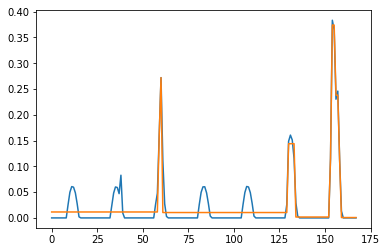

In [23]:
plt.plot(pd.DataFrame({'vals':raw['Photovoltaic\r\n[kW/kWp]'].values, 'weight':1}).iloc[:168,0])
plt.plot(predicted.iloc[:168,0])

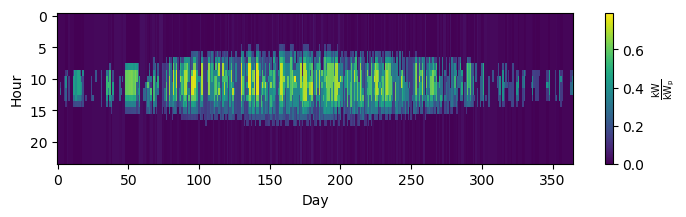

In [24]:
plotTS(predicted.iloc[:,0], 24, vmin = raw['Photovoltaic\r\n[kW/kWp]'].min(), vmax = raw['Photovoltaic\r\n[kW/kWp]'].max(), figName='Segmentation')

In [28]:
wednesdaysWinter=[]
for i in range(0,13):
    wednesdaysWinter.append(raw.iloc[i*168+24:i*168+48].reset_index(drop=True))
wednesdaysWinter=pd.concat(wednesdaysWinter, axis=1).mean(axis=1)

wednesdaysSpring=[]
for i in range(13,26):
    wednesdaysSpring.append(raw.iloc[i*168+24:i*168+48].reset_index(drop=True))
wednesdaysSpring=pd.concat(wednesdaysSpring, axis=1).mean(axis=1)

wednesdaysSummer=[]
for i in range(26,39):
    wednesdaysSummer.append(raw.iloc[i*168+24:i*168+48].reset_index(drop=True))
wednesdaysSummer=pd.concat(wednesdaysSummer, axis=1).mean(axis=1)

wednesdaysAutumn=[]
for i in range(39,52):
    wednesdaysAutumn.append(raw.iloc[i*168+24:i*168+48].reset_index(drop=True))
wednesdaysAutumn=pd.concat(wednesdaysAutumn, axis=1).mean(axis=1)

In [29]:
saturdaysWinter=[]
for i in range(0,13):
    saturdaysWinter.append(raw.iloc[i*168+96:i*168+120].reset_index(drop=True))
saturdaysWinter=pd.concat(saturdaysWinter, axis=1).mean(axis=1)

saturdaysSpring=[]
for i in range(13,26):
    saturdaysSpring.append(raw.iloc[i*168+96:i*168+120].reset_index(drop=True))
saturdaysSpring=pd.concat(saturdaysSpring, axis=1).mean(axis=1)

saturdaysSummer=[]
for i in range(26,39):
    saturdaysSummer.append(raw.iloc[i*168+96:i*168+120].reset_index(drop=True))
saturdaysSummer=pd.concat(saturdaysSummer, axis=1).mean(axis=1)

saturdaysAutumn=[]
for i in range(39,52):
    saturdaysAutumn.append(raw.iloc[i*168+96:i*168+120].reset_index(drop=True))
saturdaysAutumn=pd.concat(saturdaysAutumn, axis=1).mean(axis=1)

In [30]:
sundaysWinter=[]
for i in range(0,13):
    sundaysWinter.append(raw.iloc[i*168+120:i*168+144].reset_index(drop=True))
sundaysWinter=pd.concat(sundaysWinter, axis=1).mean(axis=1)

sundaysSpring=[]
for i in range(13,26):
    sundaysSpring.append(raw.iloc[i*168+120:i*168+144].reset_index(drop=True))
sundaysSpring=pd.concat(sundaysSpring, axis=1).mean(axis=1)

sundaysSummer=[]
for i in range(26,39):
    sundaysSummer.append(raw.iloc[i*168+120:i*168+144].reset_index(drop=True))
sundaysSummer=pd.concat(sundaysSummer, axis=1).mean(axis=1)

sundaysAutumn=[]
for i in range(39,52):
    sundaysAutumn.append(raw.iloc[i*168+120:i*168+144].reset_index(drop=True))
sundaysAutumn=pd.concat(sundaysAutumn, axis=1).mean(axis=1)

In [31]:
winter=[wednesdaysWinter,wednesdaysWinter,wednesdaysWinter,wednesdaysWinter,wednesdaysWinter,saturdaysWinter,sundaysWinter]
spring=[wednesdaysSpring,wednesdaysSpring,wednesdaysSpring,wednesdaysSpring,wednesdaysSpring,saturdaysSpring,sundaysSpring]
summer=[wednesdaysSummer,wednesdaysSummer,wednesdaysSummer,wednesdaysSummer,wednesdaysSummer,saturdaysSummer,sundaysSummer]
autumn=[wednesdaysAutumn,wednesdaysAutumn,wednesdaysAutumn,wednesdaysAutumn,wednesdaysAutumn,saturdaysAutumn,sundaysAutumn]
winter=pd.concat(winter, axis=0).reset_index(drop=True)
spring=pd.concat(spring, axis=0).reset_index(drop=True)
summer=pd.concat(summer, axis=0).reset_index(drop=True)
autumn=pd.concat(autumn, axis=0).reset_index(drop=True)

In [32]:
winter=pd.concat([winter]*13, ignore_index=True)
spring=pd.concat([spring]*13, ignore_index=True)
summer=pd.concat([summer]*13, ignore_index=True)
autumn=pd.concat([autumn]*13, ignore_index=True)

In [33]:
timeSliceYear=pd.concat([winter, spring, summer, autumn, wednesdaysWinter], ignore_index=True)

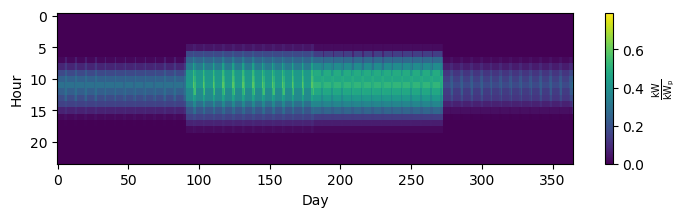

In [34]:
plotTS(timeSliceYear, 24, vmin = raw.min(), vmax = raw.max(), figName='TimeSlices')